In [90]:
import numpy as np
import cupy as cp
from holotomocupy.holo import G, GT
from holotomocupy.shift import S, ST
from holotomocupy.chunking import gpu_batch
from holotomocupy.recon_methods import CTFPurePhase, multiPaganin
from holotomocupy.proc import dai_yuan, linear
import holotomocupy.chunking as chunking
from holotomocupy.utils import *



# Init data sizes and parametes of the PXM of ID16A

In [91]:
n = 512  # object size in each dimension

noise = 0
z1c = -19.5e-3
# thickness of the coded aperture
code_thickness = 1.8e-6 #in m
# feature size
ill_feature_size = 2e-6 #in m

# ntheta = int(sys.argv[1])  # number of angles (rotations)
# noise = int(sys.argv[2])#sys.argv[2]=='True'
# z1c = float(sys.argv[3])  # positions of the code and the probe for reconstruction

center = n/2 # rotation axis
npos = 49  # number of code positions
detector_pixelsize = 3e-6
energy = 33.35  # [keV] xray energy
wavelength = 1.2398419840550367e-09/energy  # [m] wave length
focusToDetectorDistance = 1.28  # [m]
sx0 = 3.7e-4
z1 = z1c
z1 = np.tile(z1, [npos])
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnifications = focusToDetectorDistance/z1
voxelsize = np.abs(detector_pixelsize/magnifications[0]*2048/n)  # object voxel size
# allow padding if there are shifts of the probe
pad = n//8
# sample size after demagnification
ne = 1200+2*pad

show = True

flg = f'{n}_{1}_{npos}_{z1c}_{noise}_code'
path = f'/data2/vnikitin/nfp_codes'

## Read data

In [92]:
data00 = np.zeros([1, npos, n, n], dtype='float32')
ref0 = np.zeros([1, npos, n, n], dtype='float32')
print(f'{path}/data/data_{0}_{flg}.tiff')
for k in range(npos):
    data00[:, k] = read_tiff(f'{path}/data/data_{k}_{flg}.tiff')[:1]
for k in range(npos):
    ref0[:, k] = read_tiff(f'{path}/data/ref_{k}_{flg}.tiff')[:]
code = np.load(f'{path}/data/code_{flg}.npy')
shifts_code = np.load(f'{path}/data/shifts_code_{flg}.npy')[:, :npos]



/data2/vnikitin/nfp_codes/data/data_0_512_1_49_-0.0195_0_code.tiff


# Construct operators


In [93]:
def _fwd_holo(psi, shifts_code, prb):
    prb = cp.array(prb)
    psi = cp.array(psi)

    data = cp.zeros([psi.shape[0], npos, n, n], dtype='complex64')
    for i in range(npos):
        psir = psi.copy()
        prbr = cp.tile(prb, [psi.shape[0], 1, 1])

        # shift and crop the code 
        psir = S(psir, shifts_code[:, i])
        nee = psir.shape[1]        
        psir = psir[:, nee//2-n//2-pad:nee//2+n//2+pad, nee//2-n//2-pad:nee//2+n//2+pad]

        # multiply by the probe
        psir *= prbr
        
        # propagate to the detector
        psir = G(psir, wavelength, voxelsize, distances[i])
        
        # unpad
        data[:, i] = psir[:, pad:n+pad, pad:n+pad]
    return data

def fwd_holo(psi, prb):
    return _fwd_holo(psi, shifts_code,  prb)

def _adj_holo(data, shifts_code, prb):
    prb = cp.array(prb)
    psi = cp.zeros([data.shape[0], ne, ne], dtype='complex64')

    for j in range(npos):
        prbr = cp.tile(prb,[data.shape[0],1,1])        
        psir = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))

        psir = GT(psir, wavelength, voxelsize, distances[j])        
        psir *= cp.conj(prbr)
        psir = cp.pad(psir,((0,0),(ne//2-n//2-pad,ne//2-n//2-pad),(ne//2-n//2-pad,ne//2-n//2-pad)))        
        psi += ST(psir,shifts_code[:,j])
    return psi

@gpu_batch
def _adj_holo_prb(data, shifts_code, psi):
    psi = cp.array(psi)
    shifts_code = cp.array(shifts_code)       
    prb = cp.zeros([data.shape[0], n+2*pad, n+2*pad], dtype='complex64')
    for j in range(npos):
        prbr = np.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))        
        psir = psi.copy()

        prbr = GT(prbr, wavelength, voxelsize, distances[j])
        psir = S(psir, shifts_code[:, j])
        psir = psir[:, ne//2-n//2-pad:ne//2+n//2+pad, ne//2-n//2-pad:ne//2+n//2+pad]
        prbr *= cp.conj(psir)

        prb += prbr
    return prb

def fwd_holo(psi, prb):
    return _fwd_holo(psi, shifts_code, prb)
def adj_holo(data, prb):
    return _adj_holo(data, shifts_code, prb)
def adj_holo_prb(data, psi):
    return np.sum(_adj_holo_prb(data, shifts_code, psi), axis=0)[np.newaxis]

# adjoint tests
data = cp.array(data00)
arr1 = cp.pad(data[:,0],((0,0),(ne//2-n//2,ne//2-n//2),(ne//2-n//2,ne//2-n//2)),'symmetric')     
prb1 = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
shifts_code = cp.array(shifts_code)
arr2 = fwd_holo(arr1, prb1)
arr3 = adj_holo(arr2, prb1)
arr4 = adj_holo_prb(arr2, arr1)

print(f'{cp.sum(arr1*cp.conj(arr3))}==\n{cp.sum(arr2*cp.conj(arr2))}')
print(f'{cp.sum(prb1*cp.conj(arr4))}==\n{cp.sum(arr2*cp.conj(arr2))}')

(15706397+65.68206787109375j)==
(15706320-1.278997751796851e-05j)
(15706320+0.00806283950805664j)==
(15706320-1.278997751796851e-05j)


### Divide by reference image for 1step Paganin reconsturction

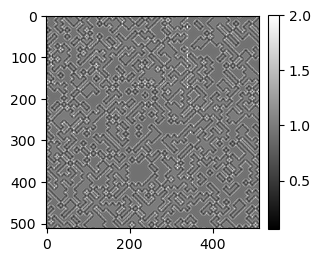

In [94]:
ref0 = cp.array(ref0)
data00 = cp.array(data00)

rdata = data00/ref0
mshow((rdata)[0,0],show,vmax=2)

/tmp/ipykernel_657263/3561898921.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  recMultiPaganin[:,j] = ST(r,shifts_code[:,j])
/tmp/ipykernel_657263/3561898921.py:10: ComplexWarning: Casting complex values to real discards the imaginary part
  recMultiPaganinr[:,j] = ST(rr,shifts_code[:,j])


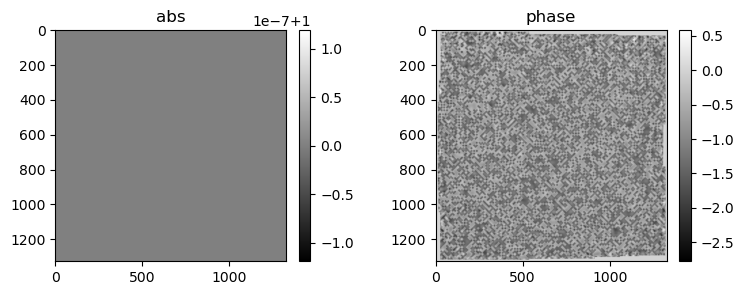

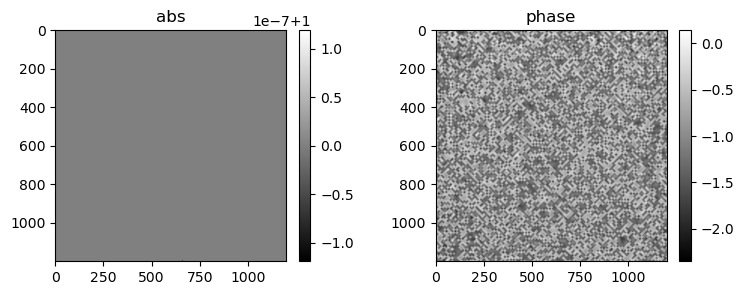

In [95]:
recMultiPaganin = cp.zeros([1,npos,ne,ne],dtype='float32')
recMultiPaganinr = cp.zeros([1,npos,ne,ne],dtype='float32')# to compensate for overlap
for j in range(0,npos):
    r = multiPaganin(rdata[:,j:j+1],
                         distances[j:j+1], wavelength, voxelsize,  24.05, 5e-2)    
    rr = r*0+1 # to compensate for overlap
    r = cp.pad(r,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    rr = cp.pad(rr,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    recMultiPaganin[:,j] = ST(r,shifts_code[:,j])
    recMultiPaganinr[:,j] = ST(rr,shifts_code[:,j])
    
recMultiPaganin = cp.sum(recMultiPaganin,axis=1)
recMultiPaganinr = cp.sum(recMultiPaganinr,axis=1)

# avoid division by 0
recMultiPaganinr[np.abs(recMultiPaganinr)<5e-2] = 1

# compensate for overlap
recMultiPaganin /= recMultiPaganinr
recMultiPaganin = cp.exp(1j*recMultiPaganin)

mshow_polar(recMultiPaganin[0],show)
mshow_polar(recMultiPaganin[0,pad:-pad,pad:-pad],show)


In [96]:
@gpu_batch
def _fwd_holo0(prb):
    data = cp.zeros([1, npos, n, n], dtype='complex64')
    for j in range(npos):
        # ill shift for each acquisition
        prbr = S(prb)
        # propagate illumination
        data[:, j] = G(prbr, wavelength, voxelsize, distances[0])[:, pad:n+pad, pad:n+pad]
    return data
def fwd_holo0(prb):
    return _fwd_holo0(prb)

@gpu_batch
def _adj_holo0(data):
    prb = cp.zeros([1, n+2*pad, n+2*pad], dtype='complex64')
    for j in range(npos):
        # ill shift for each acquisition
        prbr = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad)))
        # propagate illumination
        prbr = GT(prbr, wavelength, voxelsize, distances[0])
        # ill shift for each acquisition
        prb += prbr
    return prb
def adj_holo0(data):
    return _adj_holo0(data)

# adjoint test
data = cp.array(data00[0, :])
ref = cp.array(ref0)
prb1 = cp.array(ref[0, :1]+1j*ref[0, :1]).astype('complex64')
prb1 = cp.pad(prb1, ((0, 0), (pad, pad), (pad, pad)))
arr2 = fwd_holo0(prb1)
arr3 = adj_holo0(arr2)

print(f'{np.sum(prb1*np.conj(arr3))}==\n{np.sum(arr2*np.conj(arr2))}')

(32053068-0.4072169065475464j)==
(32053070-0.00012301640526857227j)


# Estimation with the reference data

0) gammaprb=0.03125, err=1.34720e+05


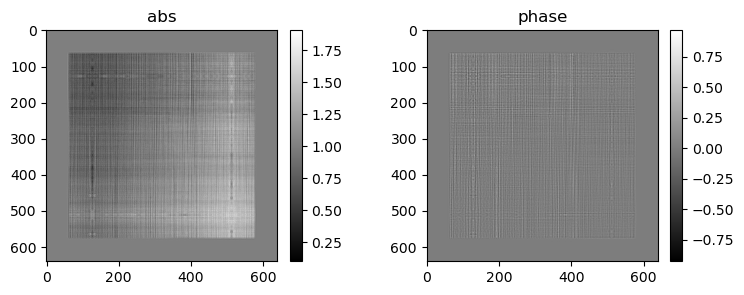

1) gammaprb=0.03125, err=3.72056e+02
2) gammaprb=0.0625, err=1.96285e+01
3) gammaprb=0.03125, err=2.57813e+00
4) gammaprb=0.03125, err=1.33357e-01
5) gammaprb=0.03125, err=1.75171e-02
6) gammaprb=0.03125, err=9.06338e-04
7) gammaprb=0.03125, err=1.19782e-04


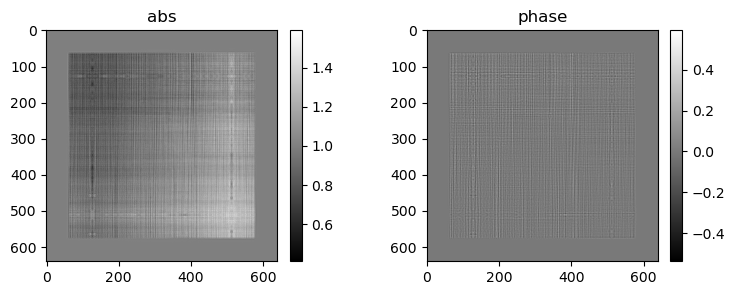

In [97]:
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while (minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if (gamma <= 1e-12):  # direction not found
        # print('no direction')
        gamma = 0
    return gamma
def cg_holo(ref, init_prb,  pars):
    """Conjugate gradients method for holography"""
    # minimization functional
    def minf(fprb):
        f = np.linalg.norm(np.abs(fprb)-ref)**2
        return f

    ref = np.sqrt(ref)
    prb = init_prb.copy()

    for i in range(pars['niter']):
        fprb0 = fwd_holo0(prb)
        gradprb = adj_holo0(fprb0-ref*np.exp(1j*np.angle(fprb0)))

        if i == 0:
            dprb = -gradprb
        else:
            dprb = dai_yuan(dprb,gradprb,gradprb0)
        gradprb0 = gradprb

        # line search
        fdprb0 = fwd_holo0(dprb)
        gammaprb = line_search(minf, pars['gammaprb'], fprb0, fdprb0)
        prb = prb + gammaprb*dprb

        if i % pars['err_step'] == 0:
            fprb0 = fwd_holo0(prb)
            err = minf(fprb0)
            print(f'{i}) {gammaprb=}, {err=:1.5e}')

        if i % pars['vis_step'] == 0:
            mshow_polar(prb[0],show)

    return prb

rec_prb0 = cp.ones([1, n+2*pad, n+2*pad], dtype='complex64')
ref = cp.array(ref0)
pars = {'niter': 8, 'err_step': 1, 'vis_step': 7, 'gammaprb': 0.5}
rec_prb0 = cg_holo(ref, rec_prb0, pars)

#### Reconstruction with the CG (Carlsson) with Hessians

In [98]:
import time
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while (minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if (gamma <= 1e-12):  # direction not found
        # print('no direction')
        gamma = 0
    return gamma

    
def hessian2(psi,prb,ksi,eta):
    Lksi = fwd_holo(ksi,prb)
    Leta = fwd_holo(eta,prb)
    Lpsi = fwd_holo(psi,prb)        

    v1 = cp.abs(Lpsi)-data
    v2 = cp.real(cp.conj(Lksi)*Leta)/cp.abs(Lpsi)            
    v3 = cp.real(cp.conj(Lpsi)*Lksi) * cp.real(cp.conj(Lpsi)*Leta) / cp.abs(Lpsi)**3    
    v4 = cp.real(cp.conj(Lpsi)*Lksi)/cp.abs(Lpsi)
    v5 = cp.real(cp.conj(Lpsi)*Leta)/cp.abs(Lpsi)
    return 2*(cp.sum(v1 * cp.conj(v2-v3)) + cp.sum(v4*cp.conj(v5)))

    
def hessianprb2(psi,prb,ksi,eta):
    Lksi = fwd_holo(psi,ksi)
    Leta = fwd_holo(psi,eta)
    Lpsi = fwd_holo(psi,prb)        

    v1 = cp.abs(Lpsi)-data
    v2 = cp.real(cp.conj(Lksi)*Leta)/cp.abs(Lpsi)            
    v3 = cp.real(cp.conj(Lpsi)*Lksi) * cp.real(cp.conj(Lpsi)*Leta) / cp.abs(Lpsi)**3    
    v4 = cp.real(cp.conj(Lpsi)*Lksi)/cp.abs(Lpsi)
    v5 = cp.real(cp.conj(Lpsi)*Leta)/cp.abs(Lpsi)
    return 2*(cp.sum(v1 * cp.conj(v2-v3)) + cp.sum(v4*cp.conj(v5)))

def cg_holo(data,ref, init_psi,init_prb,  pars):
    """Conjugate gradients method for holography"""
    # minimization functional
    def minf(fpsi):
        f = np.linalg.norm(np.abs(fpsi)-data)**2
        return f


    data = np.sqrt(data)
    ref = np.sqrt(ref)
    psi = init_psi.copy()
    prb = init_prb.copy()

    conv = np.zeros(pars['niter'])
    tt = np.zeros(10)
    for i in range(pars['niter']):
        
        t= time.time()
        fpsi = fwd_holo(psi,prb)
        tt[0] = time.time()-t
        
        t= time.time()
        grad = adj_holo(fpsi-data*np.exp(1j*np.angle(fpsi)),prb)
        tt[1] = time.time()-t
        
        # CG direction
        t= time.time()
        if i == 0:
            eta = -grad            
        else:            
            beta = hessian2(psi,prb,grad,eta)/hessian2(psi,prb,eta,eta) 
            eta = -grad + beta*eta
        tt[2] = time.time()-t        

        # CG step
        t= time.time()
        gammah = float(-cp.sum(cp.real(grad*cp.conj(eta)))/hessian2(psi,prb,eta,eta))
        tt[3] = time.time()-t        
        
        t= time.time()
        fetapsi = fwd_holo(eta,prb)  
        tt[4] = time.time()-t           
        
        t= time.time()
        gammah = line_search(minf, gammah, fpsi, fetapsi)
        tt[5] = time.time()-t           
        psi += gammah*eta
        print(tt)
        if pars['update_probe']:
            fprb = fwd_holo(psi,prb)
            gradprb = adj_holo_prb(fprb-data*np.exp(1j*np.angle(fprb)),psi)
            if i == 0:
                etaprb = -gradprb            
            else:
                beta = hessianprb2(psi,prb,gradprb,etaprb)/hessianprb2(psi,prb,etaprb,etaprb) 
                etaprb = -gradprb + beta*etaprb
            gammaprbh = float(-cp.sum(cp.real(gradprb*cp.conj(etaprb)))/hessianprb2(psi,prb,etaprb,etaprb))
            fetaprb = fwd_holo(psi,etaprb)     
            gammaprbh = line_search(minf, gammaprbh, fprb, fetaprb)
            prb += gammaprbh*etaprb

        if i % pars['err_step'] == 0:
            fpsi = fwd_holo(psi,prb)
            err = minf(fpsi)
            conv[i] = err
            print(f'{i}) {gammah=}, {gammaprbh=}, {err=:1.5e}')

        if i % pars['vis_step'] == 0:
            mshow_polar(psi[0],show)
            mshow_polar(psi[0,pad:-pad,pad:-pad],show)
            mshow_polar(prb[0],show)

    return psi,conv

# fully on gpu
rec_psi = recMultiPaganin.copy()
data = cp.array(data00.copy())
ref = cp.array(ref0.copy())

rec_prb = cp.array(rec_prb0.copy())#cp.abs(rec_prb0).astype('complex64')#*cp.exp().copy()
# rec_psi = cp.array(np.load(f'{path}/data/code_{flg}.npy'))
# nee = rec_psi.shape[1]
# rec_psi = cp.array(rec_psi[:,nee//2-ne//2:nee//2+ne//2,nee//2-ne//2:nee//2+ne//2])
# rec_prb = cp.array(np.load(f'{path}/data/prb_{flg}.npy'))
pars = {'niter': 50, 'err_step': 1, 'vis_step': 16, 'update_probe':True}
rec_psi,conv = cg_holo(data,ref,rec_psi,rec_prb, pars)

[1.00778365e+00 9.92904425e-01 2.26497650e-05 2.98425674e+00
 9.92792845e-01 3.95894051e-03 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


KeyboardInterrupt: 

0) gammah=0.0381896011531353, gammaprbh=0.015387513674795628, err=5.14939e+04


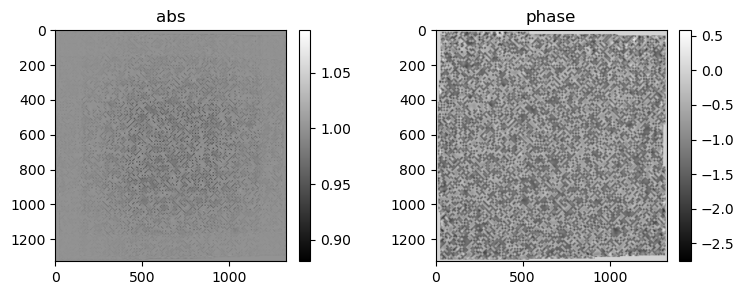

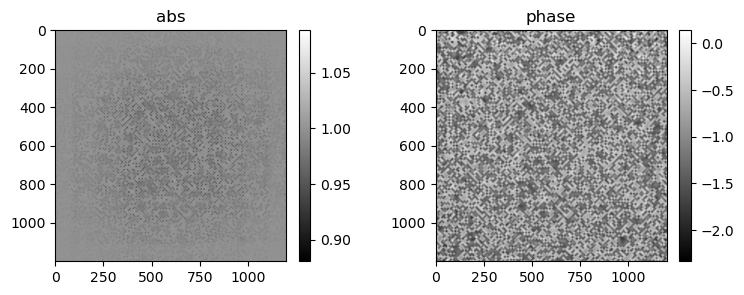

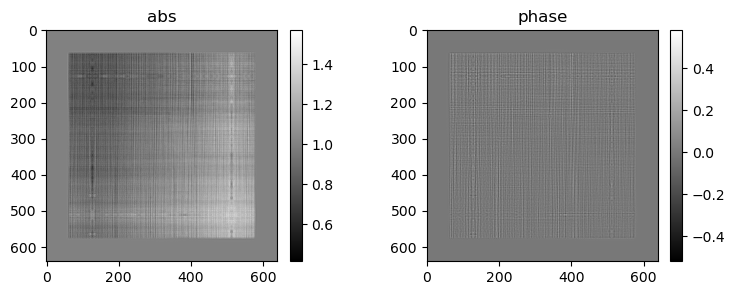

1) gammah=0.0784488096833229, gammaprbh=0.02722630836069584, err=4.47277e+04
2) gammah=0.04232620447874069, gammaprbh=0.031565651297569275, err=2.98450e+04
3) gammah=0.07123621553182602, gammaprbh=0.053970251232385635, err=2.52354e+04
4) gammah=0.053952209651470184, gammaprbh=0.051003117114305496, err=1.86652e+04
5) gammah=0.09217537939548492, gammaprbh=0.049823492765426636, err=1.63642e+04
6) gammah=0.08156387507915497, gammaprbh=0.06254039704799652, err=1.36769e+04
7) gammah=0.11170616000890732, gammaprbh=0.05141359940171242, err=1.20867e+04
8) gammah=0.14596432447433472, gammaprbh=0.060543496161699295, err=1.05099e+04
9) gammah=0.13529732823371887, gammaprbh=0.053105391561985016, err=9.30133e+03
10) gammah=0.21863092482089996, gammaprbh=0.06306307017803192, err=8.10246e+03
11) gammah=0.13588199019432068, gammaprbh=0.02732984721660614, err=7.13692e+03
12) gammah=0.2128172367811203, gammaprbh=0.06581363081932068, err=6.56012e+03
13) gammah=0.19132578372955322, gammaprbh=0.047007415443

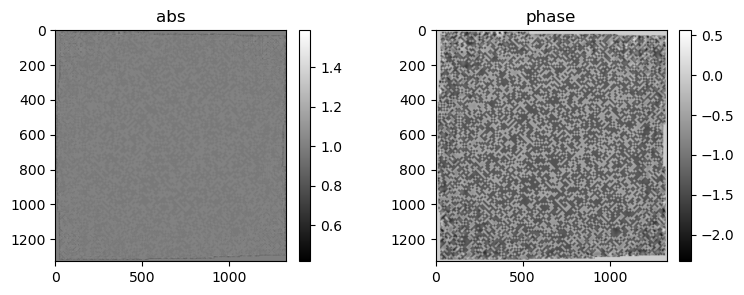

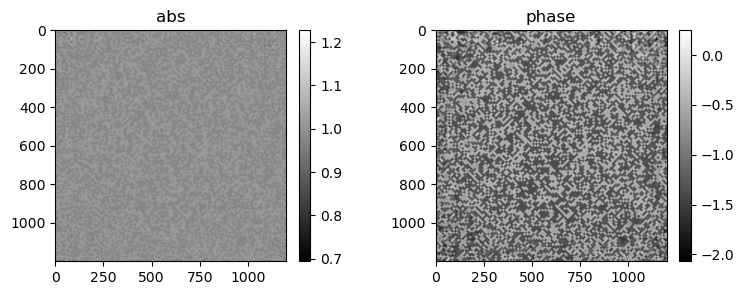

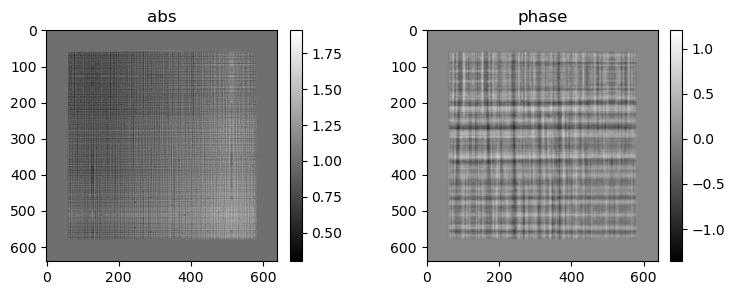

65) gammah=0.13825076818466187, gammaprbh=0.027663325890898705, err=5.54363e+02
66) gammah=0.2136845886707306, gammaprbh=0.02192164771258831, err=5.48773e+02
67) gammah=0.18664470314979553, gammaprbh=0.0361698716878891, err=5.40962e+02
68) gammah=0.17156031727790833, gammaprbh=0.04288177564740181, err=5.33165e+02
69) gammah=0.191147580742836, gammaprbh=0.03993401676416397, err=5.26007e+02
70) gammah=0.23274654150009155, gammaprbh=0.031058063730597496, err=5.17351e+02
71) gammah=0.1854526549577713, gammaprbh=0.012298353016376495, err=5.09614e+02
72) gammah=0.22333841025829315, gammaprbh=0.026540685445070267, err=4.99901e+02
73) gammah=0.19755114614963531, gammaprbh=0.017531977966427803, err=4.90487e+02
74) gammah=0.20077985525131226, gammaprbh=0.033167965710163116, err=4.80810e+02
75) gammah=0.18769091367721558, gammaprbh=0.029021121561527252, err=4.71719e+02
76) gammah=0.16981133818626404, gammaprbh=0.03388722613453865, err=4.64151e+02
77) gammah=0.169866144657135, gammaprbh=0.04275333

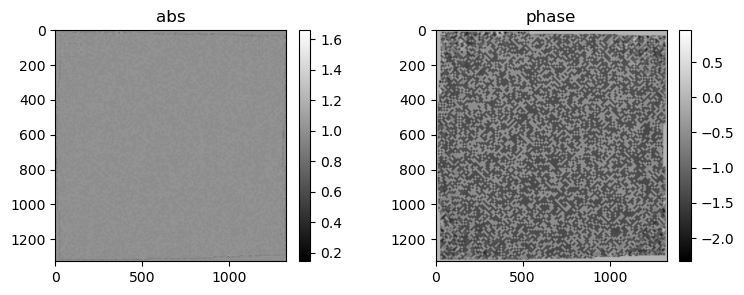

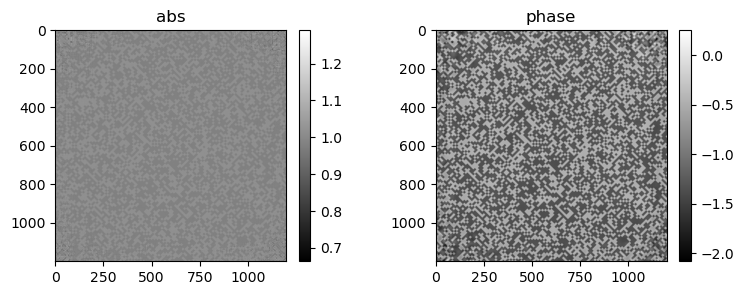

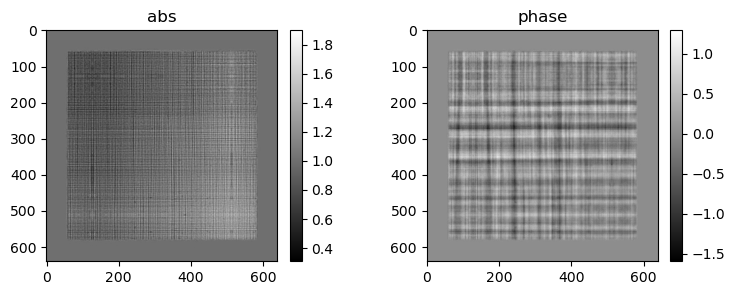

129) gammah=0.06822790205478668, gammaprbh=0.07633049786090851, err=2.15797e+02
130) gammah=0.05807305499911308, gammaprbh=0.07901887595653534, err=2.11848e+02
131) gammah=0.05014340579509735, gammaprbh=0.06795650720596313, err=2.07884e+02
132) gammah=0.06728659570217133, gammaprbh=0.04879812151193619, err=2.05618e+02
133) gammah=0.12045273184776306, gammaprbh=0.04418779909610748, err=2.03973e+02
134) gammah=0.06967967748641968, gammaprbh=0.03095635026693344, err=2.03369e+02
135) gammah=0.15520885586738586, gammaprbh=0.022776462137699127, err=2.02937e+02
136) gammah=0.12411918491125107, gammaprbh=0.03293521702289581, err=2.02528e+02
137) gammah=0.1386558562517166, gammaprbh=0.017732521519064903, err=2.02198e+02
138) gammah=0.23636215925216675, gammaprbh=0.05377914011478424, err=2.01621e+02
139) gammah=0.13368093967437744, gammaprbh=0.037746354937553406, err=2.01136e+02
140) gammah=0.13760444521903992, gammaprbh=0.07928881049156189, err=2.00866e+02
141) gammah=0.12098351120948792, gamma

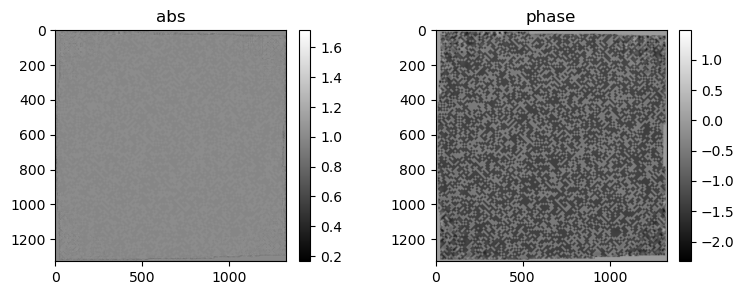

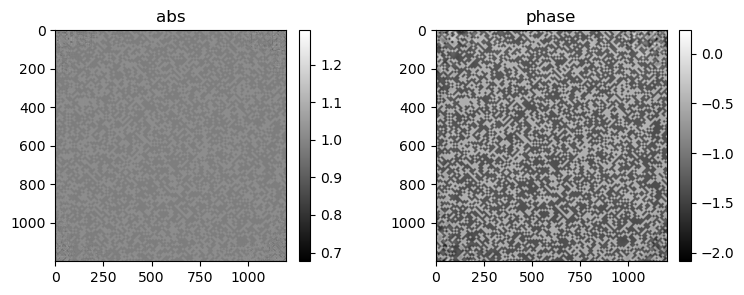

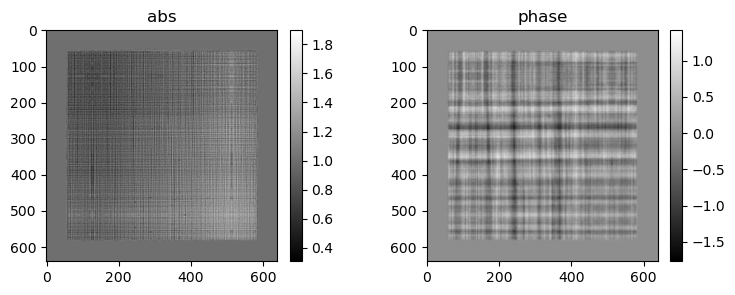

193) gammah=0.17602801322937012, gammaprbh=0.027917183935642242, err=1.45416e+02
194) gammah=0.1582680642604828, gammaprbh=0.024127179756760597, err=1.45203e+02
195) gammah=0.1658249944448471, gammaprbh=0.025100262835621834, err=1.45010e+02
196) gammah=0.16984793543815613, gammaprbh=0.024618323892354965, err=1.44814e+02
197) gammah=0.16926521062850952, gammaprbh=0.024369923397898674, err=1.44601e+02
198) gammah=0.17988896369934082, gammaprbh=0.026516644284129143, err=1.44353e+02
199) gammah=0.18421299755573273, gammaprbh=0.03312253952026367, err=1.44060e+02
200) gammah=0.16286411881446838, gammaprbh=0.03991834446787834, err=1.43767e+02
201) gammah=0.16164085268974304, gammaprbh=0.06352662295103073, err=1.43475e+02
202) gammah=0.15163986384868622, gammaprbh=0.08546634763479233, err=1.43106e+02
203) gammah=0.09815914183855057, gammaprbh=0.07735127210617065, err=1.42679e+02
204) gammah=0.04771023988723755, gammaprbh=0.09775057435035706, err=1.42040e+02
205) gammah=0.03876234591007233, gam

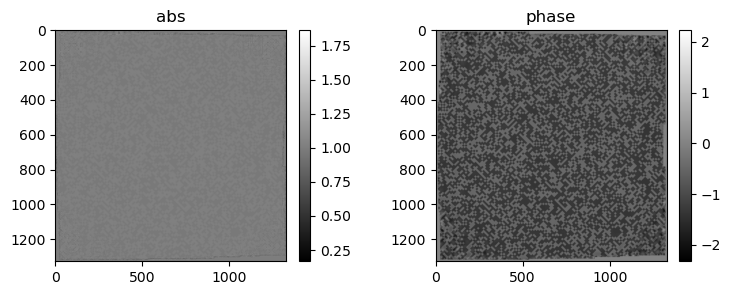

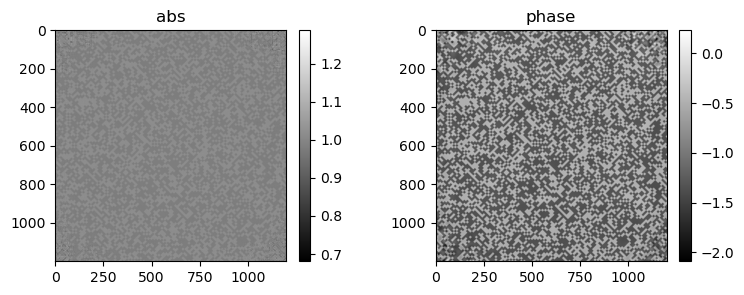

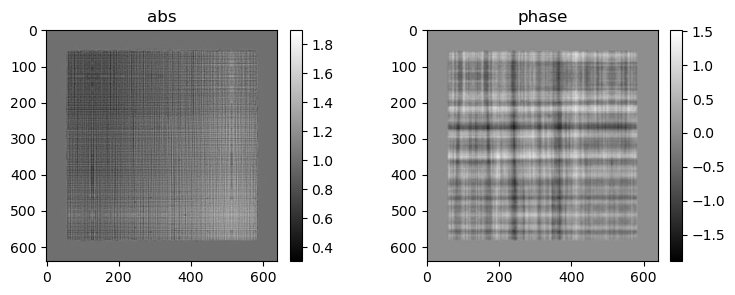

257) gammah=0.06507405638694763, gammaprbh=0.09640437364578247, err=1.09861e+02
258) gammah=0.06525354087352753, gammaprbh=0.07720588147640228, err=1.09446e+02
259) gammah=0.06562347710132599, gammaprbh=0.08731310069561005, err=1.08935e+02
260) gammah=0.060030851513147354, gammaprbh=0.08003449440002441, err=1.08345e+02
261) gammah=0.06476854532957077, gammaprbh=0.08255299925804138, err=1.07643e+02
262) gammah=0.06293809413909912, gammaprbh=0.0806458368897438, err=1.06918e+02
263) gammah=0.0773681178689003, gammaprbh=0.08122506737709045, err=1.06038e+02
264) gammah=0.06407253444194794, gammaprbh=0.07745841890573502, err=1.05169e+02
265) gammah=0.06864968687295914, gammaprbh=0.07454860210418701, err=1.04302e+02
266) gammah=0.06714533269405365, gammaprbh=0.0799955353140831, err=1.03389e+02
267) gammah=0.07680050283670425, gammaprbh=0.06538266688585281, err=1.02485e+02
268) gammah=0.07220224291086197, gammaprbh=0.0656333938241005, err=1.01739e+02
269) gammah=0.07834266871213913, gammaprbh=

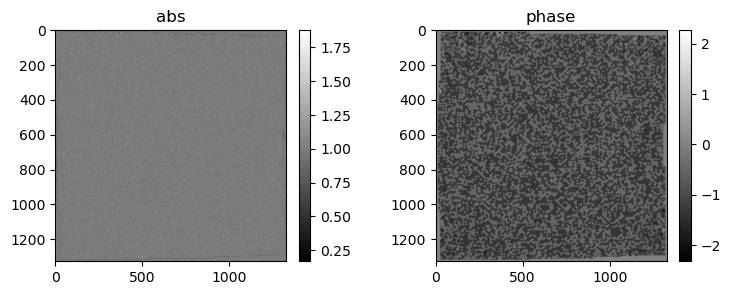

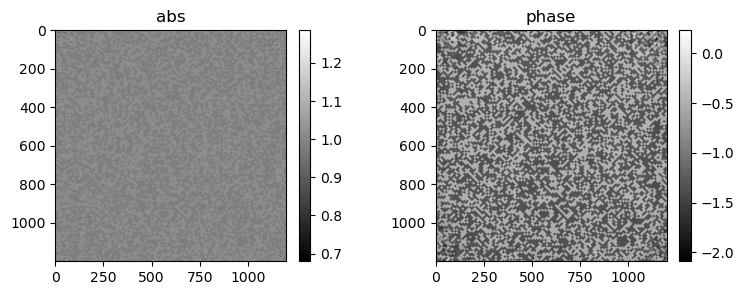

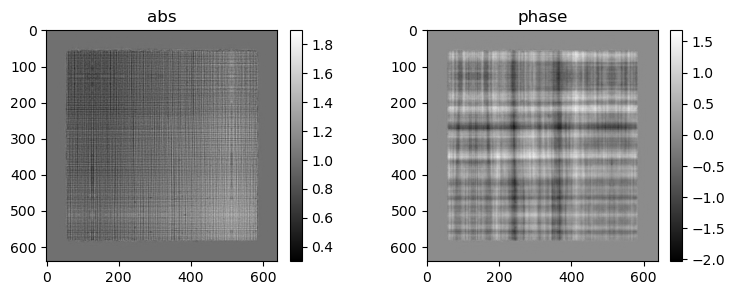

321) gammah=0.19381466507911682, gammaprbh=0.014658494852483273, err=8.79835e+01
322) gammah=0.2298695594072342, gammaprbh=0.05845918878912926, err=8.78655e+01
323) gammah=0.16556942462921143, gammaprbh=0.07444692403078079, err=8.77464e+01
324) gammah=0.14105746150016785, gammaprbh=0.09731020778417587, err=8.75859e+01
325) gammah=0.07817678153514862, gammaprbh=0.0763537660241127, err=8.73816e+01
326) gammah=0.04645775631070137, gammaprbh=0.06290972977876663, err=8.71883e+01
327) gammah=0.050109513103961945, gammaprbh=0.06812852621078491, err=8.70141e+01
328) gammah=0.07176665216684341, gammaprbh=0.06335987895727158, err=8.68414e+01
329) gammah=0.06049945205450058, gammaprbh=0.05187983810901642, err=8.67276e+01
330) gammah=0.06579340249300003, gammaprbh=0.05618801712989807, err=8.66522e+01
331) gammah=0.07368829846382141, gammaprbh=0.08269047737121582, err=8.65679e+01
332) gammah=0.09384051710367203, gammaprbh=0.0633050873875618, err=8.64691e+01
333) gammah=0.0785415843129158, gammaprbh

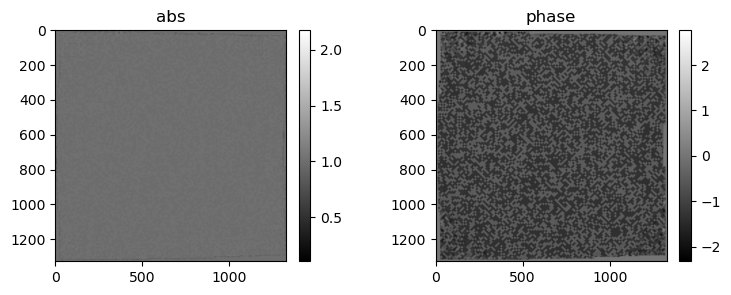

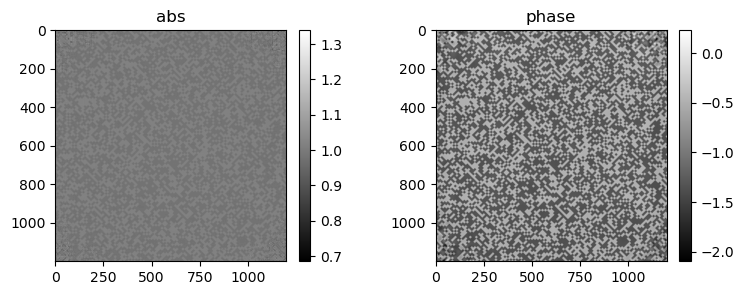

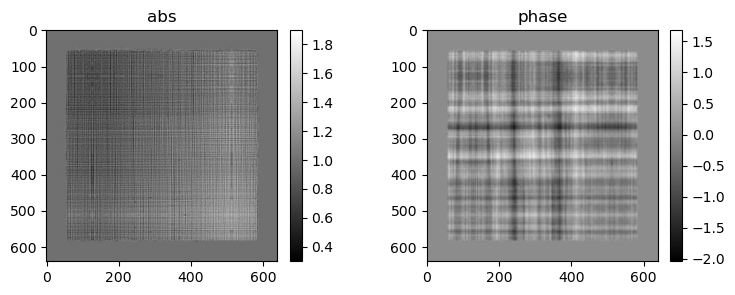

385) gammah=0.14977431297302246, gammaprbh=0.04194335639476776, err=8.31356e+01
386) gammah=0.14844466745853424, gammaprbh=0.05131480470299721, err=8.30925e+01
387) gammah=0.14226914942264557, gammaprbh=0.04200683906674385, err=8.30492e+01
388) gammah=0.13008718192577362, gammaprbh=0.021572163328528404, err=8.30128e+01
389) gammah=0.12263429164886475, gammaprbh=0.022972222417593002, err=8.29865e+01
390) gammah=0.1365213394165039, gammaprbh=0.034975264221429825, err=8.29631e+01
391) gammah=0.15572606027126312, gammaprbh=0.03335709124803543, err=8.29372e+01
392) gammah=0.15692740678787231, gammaprbh=0.020267704501748085, err=8.29081e+01
393) gammah=0.15306894481182098, gammaprbh=0.026095516979694366, err=8.28777e+01
394) gammah=0.15585799515247345, gammaprbh=0.04799120873212814, err=8.28454e+01
395) gammah=0.152353435754776, gammaprbh=0.047187574207782745, err=8.28097e+01
396) gammah=0.1397406905889511, gammaprbh=0.027924729511141777, err=8.27763e+01
397) gammah=0.12987330555915833, gamm

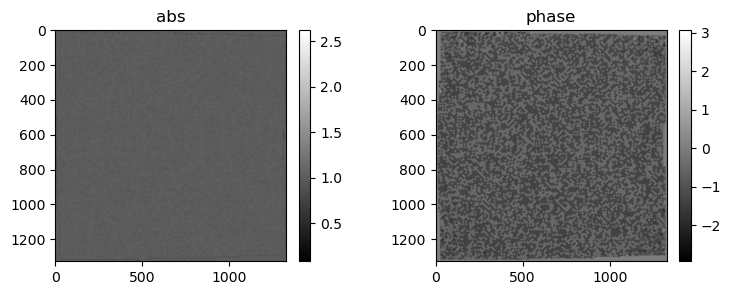

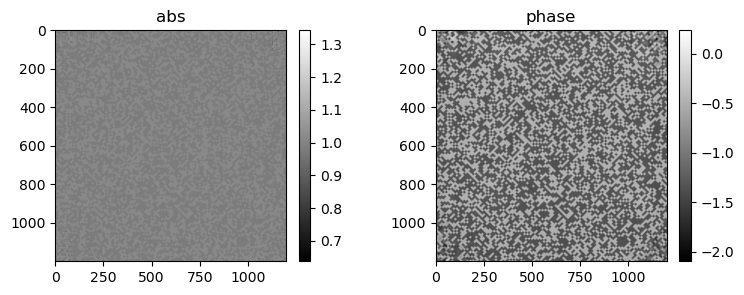

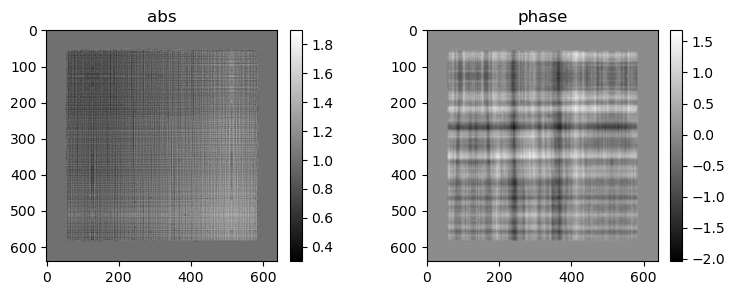

449) gammah=0.13640551269054413, gammaprbh=0.03707607090473175, err=8.15711e+01
450) gammah=0.13767914474010468, gammaprbh=0.0328461229801178, err=8.15456e+01
451) gammah=0.1338774710893631, gammaprbh=0.026752013713121414, err=8.15186e+01
452) gammah=0.127099871635437, gammaprbh=0.018510794267058372, err=8.14922e+01
453) gammah=0.12321235239505768, gammaprbh=0.021705010905861855, err=8.14682e+01
454) gammah=0.12110116332769394, gammaprbh=0.029112346470355988, err=8.14469e+01
455) gammah=0.12160608917474747, gammaprbh=0.030485542491078377, err=8.14270e+01
456) gammah=0.1254066377878189, gammaprbh=0.02567329630255699, err=8.14071e+01
457) gammah=0.12828990817070007, gammaprbh=0.026758244261145592, err=8.13887e+01
458) gammah=0.12741237878799438, gammaprbh=0.03546984866261482, err=8.13710e+01
459) gammah=0.12794770300388336, gammaprbh=0.04574080556631088, err=8.13538e+01
460) gammah=0.1257137656211853, gammaprbh=0.04836674779653549, err=8.13364e+01
461) gammah=0.1212233453989029, gammaprb

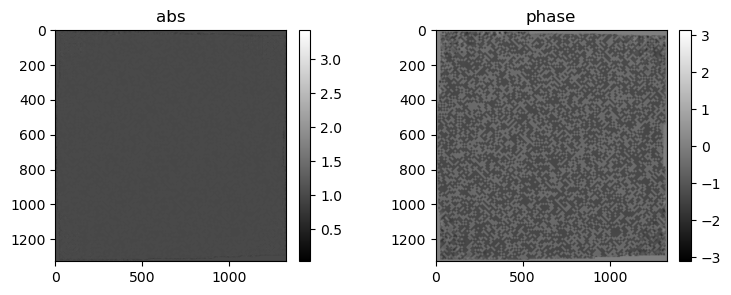

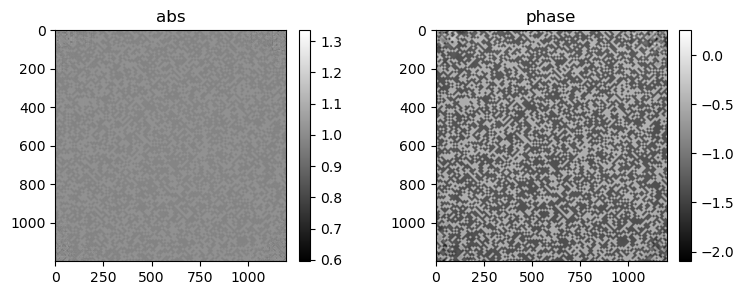

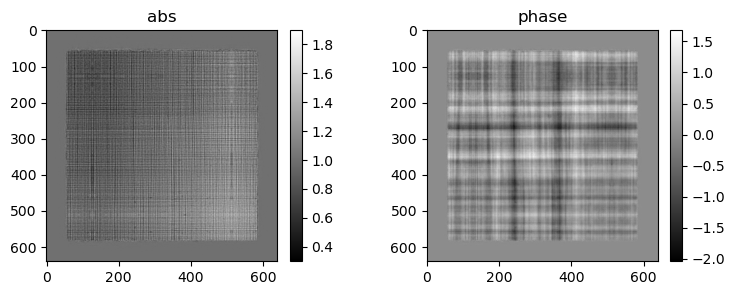

513) gammah=0.13349835574626923, gammaprbh=0.029590608552098274, err=8.04405e+01
514) gammah=0.1312781125307083, gammaprbh=0.028329964727163315, err=8.04288e+01
515) gammah=0.12399169057607651, gammaprbh=0.028735505416989326, err=8.04180e+01
516) gammah=0.12033360451459885, gammaprbh=0.026493575423955917, err=8.04080e+01
517) gammah=0.12531977891921997, gammaprbh=0.024926649406552315, err=8.03982e+01
518) gammah=0.13286787271499634, gammaprbh=0.024057405069470406, err=8.03885e+01
519) gammah=0.13445261120796204, gammaprbh=0.02219344675540924, err=8.03790e+01
520) gammah=0.13456138968467712, gammaprbh=0.03899874910712242, err=8.03688e+01
521) gammah=0.12892183661460876, gammaprbh=0.08289851993322372, err=8.03572e+01
522) gammah=0.11978144198656082, gammaprbh=0.04675731807947159, err=8.03455e+01
523) gammah=0.11777830123901367, gammaprbh=0.025438500568270683, err=8.03352e+01
524) gammah=0.11447770148515701, gammaprbh=0.025360677391290665, err=8.03272e+01
525) gammah=0.12253899872303009, 

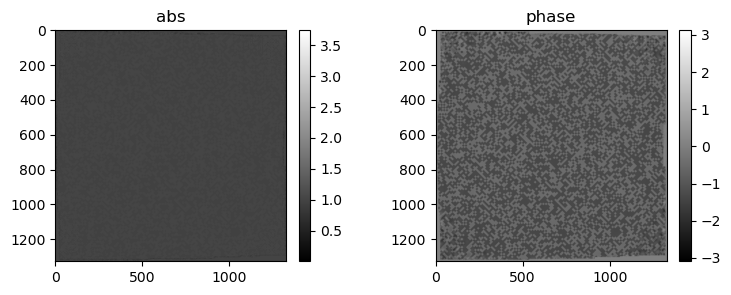

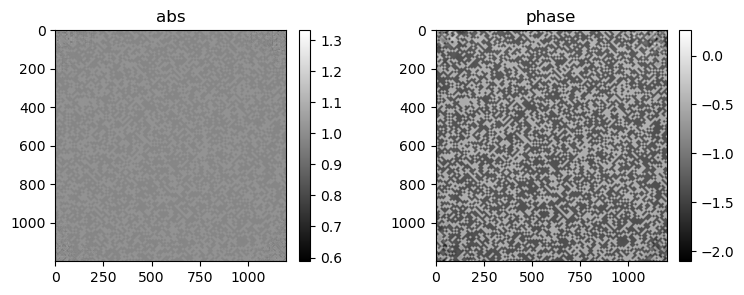

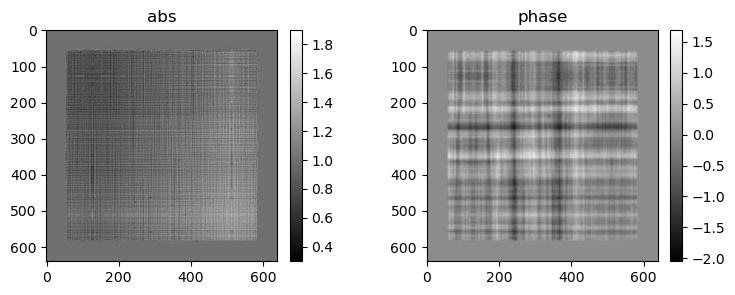

577) gammah=0.258025199174881, gammaprbh=0.03415151685476303, err=7.92105e+01
578) gammah=0.15842577815055847, gammaprbh=0.0338720940053463, err=7.92051e+01
579) gammah=0.25154733657836914, gammaprbh=0.026634275913238525, err=7.91994e+01
580) gammah=0.16719727218151093, gammaprbh=0.016009582206606865, err=7.91945e+01
581) gammah=0.22494421899318695, gammaprbh=0.02544764056801796, err=7.91891e+01
582) gammah=0.17037314176559448, gammaprbh=0.021344490349292755, err=7.91842e+01
583) gammah=0.17298048734664917, gammaprbh=0.024318087846040726, err=7.91802e+01
584) gammah=0.17276090383529663, gammaprbh=0.02723231166601181, err=7.91761e+01
585) gammah=0.17975011467933655, gammaprbh=0.028562864288687706, err=7.91721e+01
586) gammah=0.17228297889232635, gammaprbh=0.01879260316491127, err=7.91684e+01
587) gammah=0.18914209306240082, gammaprbh=0.038940053433179855, err=7.91645e+01
588) gammah=0.19666247069835663, gammaprbh=0.029846543446183205, err=7.91602e+01
589) gammah=0.1634548455476761, gamm

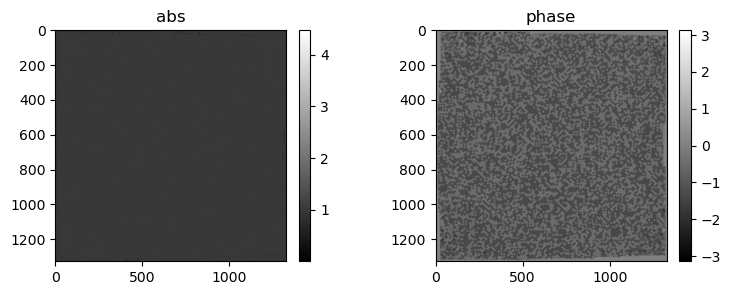

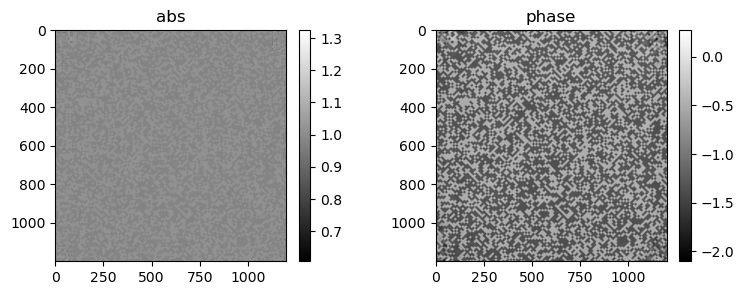

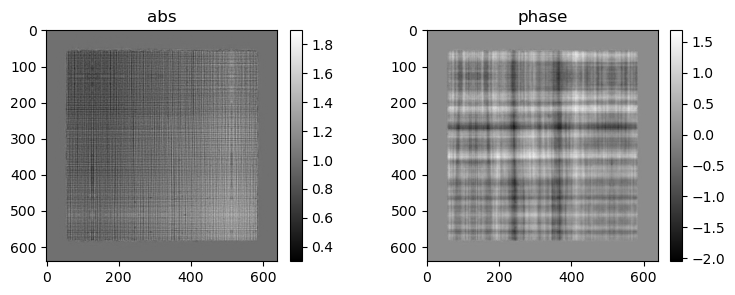

641) gammah=0.13798268139362335, gammaprbh=0.029803872108459473, err=7.87451e+01
642) gammah=0.1366683542728424, gammaprbh=0.025322625413537025, err=7.87328e+01
643) gammah=0.1357688158750534, gammaprbh=0.03235267475247383, err=7.87201e+01
644) gammah=0.12838026881217957, gammaprbh=0.05591486766934395, err=7.87069e+01
645) gammah=0.12522007524967194, gammaprbh=0.05305081233382225, err=7.86930e+01
646) gammah=0.11975286155939102, gammaprbh=0.031055845320224762, err=7.86808e+01
647) gammah=0.10699462890625, gammaprbh=0.024537168443202972, err=7.86713e+01
648) gammah=0.11037272214889526, gammaprbh=0.05440649017691612, err=7.86629e+01
649) gammah=0.11071473360061646, gammaprbh=0.05430838093161583, err=7.86545e+01
650) gammah=0.14528875052928925, gammaprbh=0.0343589149415493, err=7.86462e+01
651) gammah=0.1317681521177292, gammaprbh=0.036271389573812485, err=7.86390e+01
652) gammah=0.14325563609600067, gammaprbh=0.04394569993019104, err=7.86313e+01
653) gammah=0.13650843501091003, gammaprbh

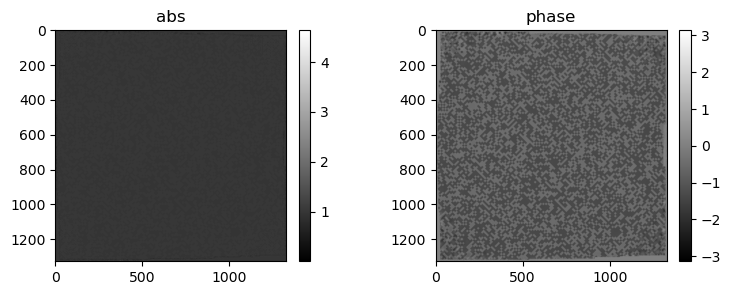

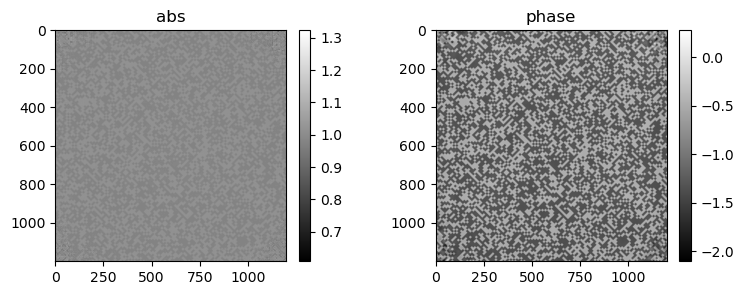

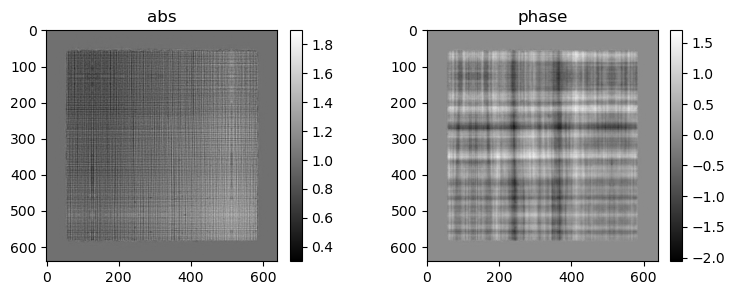

705) gammah=0.08839909732341766, gammaprbh=0.08477184176445007, err=7.76711e+01
706) gammah=0.09980498254299164, gammaprbh=0.08518292009830475, err=7.76428e+01
707) gammah=0.09323927760124207, gammaprbh=0.08806909620761871, err=7.76101e+01
708) gammah=0.08682163059711456, gammaprbh=0.08566199243068695, err=7.75759e+01
709) gammah=0.08648893982172012, gammaprbh=0.08162596821784973, err=7.75401e+01
710) gammah=0.07606630027294159, gammaprbh=0.08788132667541504, err=7.75037e+01
711) gammah=0.0860452651977539, gammaprbh=0.08890186250209808, err=7.74601e+01
712) gammah=0.08794932812452316, gammaprbh=0.0779758021235466, err=7.74168e+01
713) gammah=0.08213116973638535, gammaprbh=0.09417810291051865, err=7.73677e+01
714) gammah=0.0844828337430954, gammaprbh=0.07831873744726181, err=7.73123e+01
715) gammah=0.07266281545162201, gammaprbh=0.08537564426660538, err=7.72607e+01
716) gammah=0.08637061715126038, gammaprbh=0.09307533502578735, err=7.71901e+01
717) gammah=0.07860491424798965, gammaprbh=

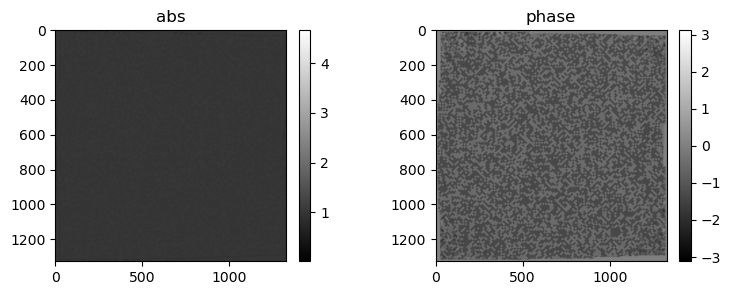

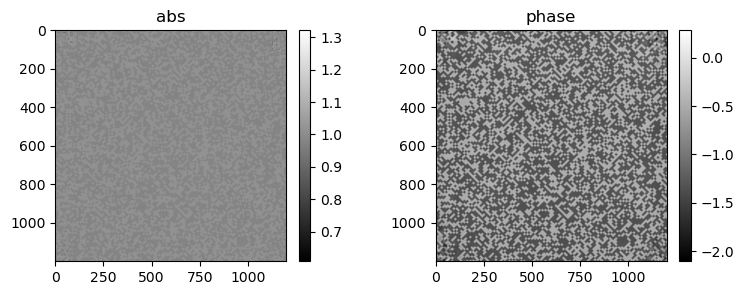

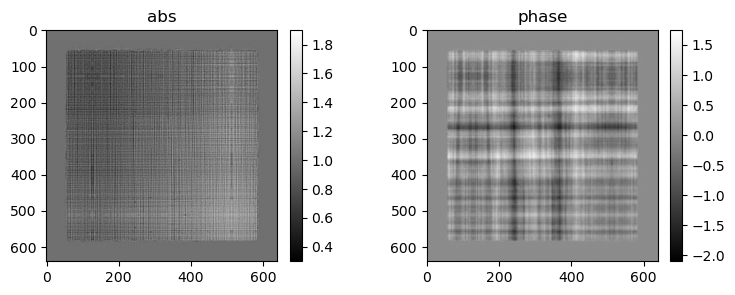

769) gammah=0.19427531957626343, gammaprbh=0.023865334689617157, err=7.54036e+01
770) gammah=0.1922004371881485, gammaprbh=0.025921903550624847, err=7.54017e+01
771) gammah=0.18995611369609833, gammaprbh=0.026999518275260925, err=7.54001e+01
772) gammah=0.18631677329540253, gammaprbh=0.028559332713484764, err=7.53988e+01
773) gammah=0.18381556868553162, gammaprbh=0.028422895818948746, err=7.53976e+01
774) gammah=0.18035642802715302, gammaprbh=0.02727672830224037, err=7.53966e+01
775) gammah=0.17919598519802094, gammaprbh=0.02838043123483658, err=7.53958e+01
776) gammah=0.17835651338100433, gammaprbh=0.029216576367616653, err=7.53951e+01
777) gammah=0.1730566769838333, gammaprbh=0.02950824424624443, err=7.53946e+01
778) gammah=0.1703048199415207, gammaprbh=0.03106304071843624, err=7.53941e+01
779) gammah=0.1697339415550232, gammaprbh=0.033366527408361435, err=7.53936e+01
780) gammah=0.164714977145195, gammaprbh=0.036227524280548096, err=7.53931e+01
781) gammah=0.15959490835666656, gamma

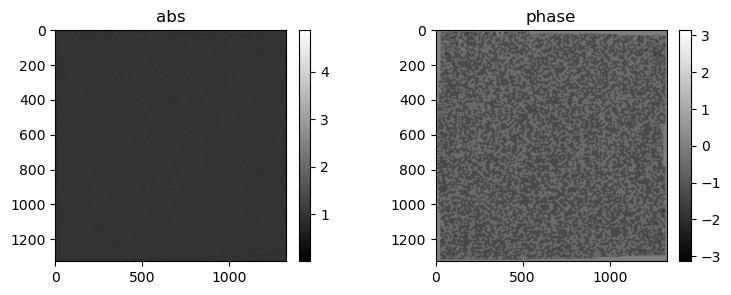

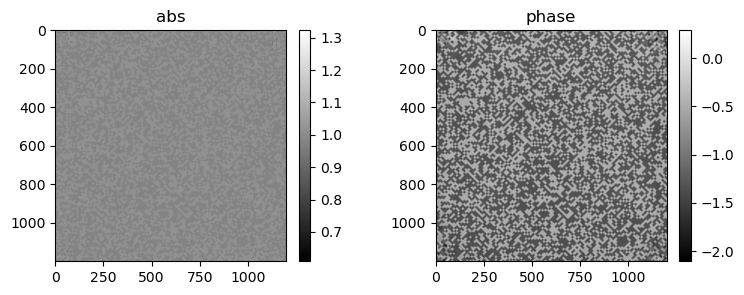

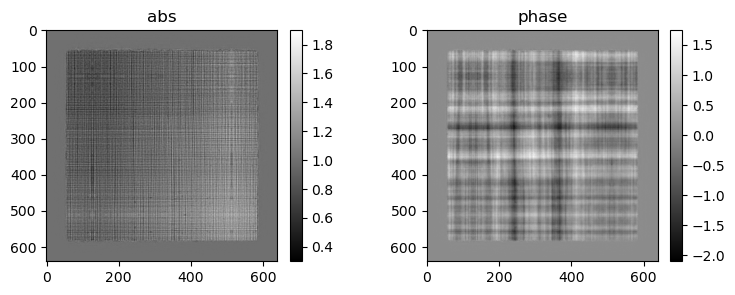

833) gammah=0.18104587495326996, gammaprbh=0.023865574970841408, err=7.52559e+01
834) gammah=0.20098358392715454, gammaprbh=0.022136785089969635, err=7.52551e+01
835) gammah=0.20602504909038544, gammaprbh=0.020848793908953667, err=7.52547e+01
836) gammah=0.23185493052005768, gammaprbh=0.024722954258322716, err=7.52545e+01
837) gammah=0.10025898367166519, gammaprbh=0.07436157017946243, err=7.52541e+01
838) gammah=0.16400180757045746, gammaprbh=0.07142307609319687, err=7.52531e+01
839) gammah=0.12378007173538208, gammaprbh=0.04413823038339615, err=7.52523e+01
840) gammah=0.2058364748954773, gammaprbh=0.02532188780605793, err=7.52518e+01
841) gammah=0.27647989988327026, gammaprbh=0.009000484831631184, err=7.52511e+01
842) gammah=0.23595711588859558, gammaprbh=0.021887192502617836, err=7.52503e+01
843) gammah=0.20091961324214935, gammaprbh=0.02114029787480831, err=7.52498e+01
844) gammah=0.11276140809059143, gammaprbh=0.03330112621188164, err=7.52494e+01
845) gammah=0.1151014193892479, gam

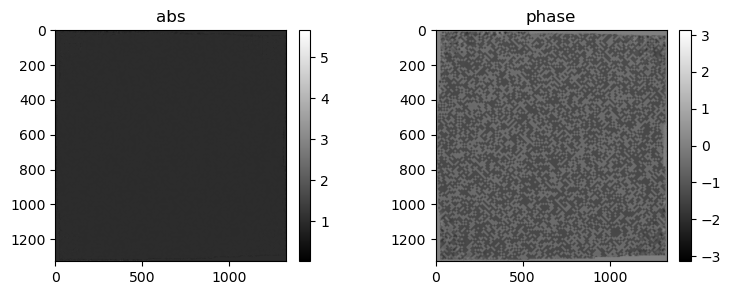

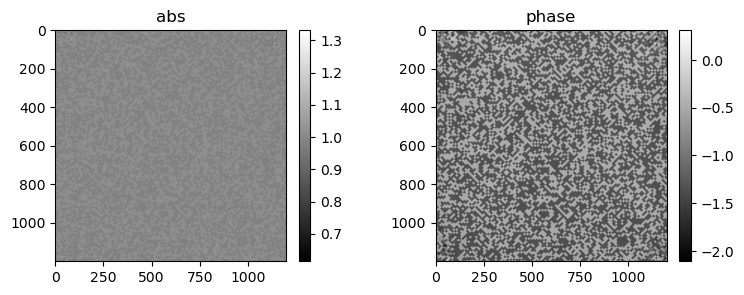

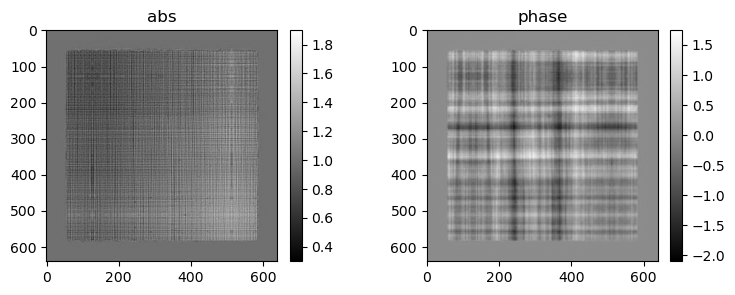

897) gammah=0.14724215865135193, gammaprbh=0.013777962885797024, err=7.51343e+01
898) gammah=0.1732742190361023, gammaprbh=0.014040885493159294, err=7.51293e+01
899) gammah=0.1618817299604416, gammaprbh=0.011583489365875721, err=7.51236e+01
900) gammah=0.14324946701526642, gammaprbh=0.01144228782504797, err=7.51183e+01
901) gammah=0.15234269201755524, gammaprbh=0.014942776411771774, err=7.51135e+01
902) gammah=0.13788126409053802, gammaprbh=0.012952670454978943, err=7.51093e+01
903) gammah=0.1391427218914032, gammaprbh=0.01370333880186081, err=7.51056e+01
904) gammah=0.14632649719715118, gammaprbh=0.012079461477696896, err=7.51022e+01
905) gammah=0.16386297345161438, gammaprbh=0.013437312096357346, err=7.50983e+01
906) gammah=0.1495024859905243, gammaprbh=0.013846361078321934, err=7.50943e+01
907) gammah=0.13223275542259216, gammaprbh=0.014401789754629135, err=7.50907e+01
908) gammah=0.12847289443016052, gammaprbh=0.01500281784683466, err=7.50877e+01
909) gammah=0.13592658936977386, ga

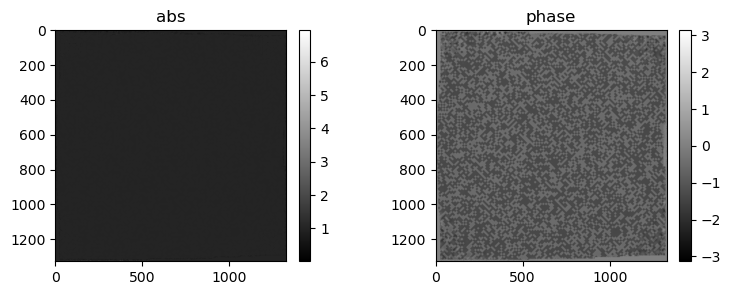

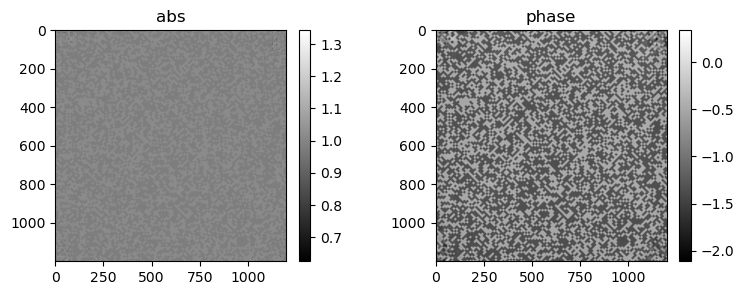

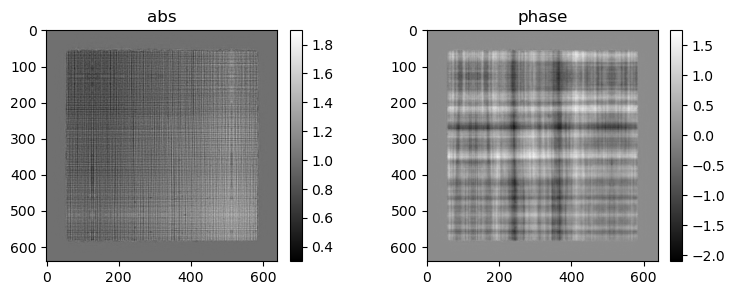

961) gammah=0.07260260730981827, gammaprbh=0.0793435350060463, err=7.49993e+01
962) gammah=0.0867929607629776, gammaprbh=0.08305244892835617, err=7.49947e+01
963) gammah=0.07382713258266449, gammaprbh=0.09307265281677246, err=7.49894e+01
964) gammah=0.0879170224070549, gammaprbh=0.07469818741083145, err=7.49838e+01
965) gammah=0.08735319972038269, gammaprbh=0.09945253282785416, err=7.49773e+01
966) gammah=0.08546365797519684, gammaprbh=0.08391135185956955, err=7.49702e+01
967) gammah=0.09656935930252075, gammaprbh=0.0805753767490387, err=7.49635e+01
968) gammah=0.10195575654506683, gammaprbh=0.08571971207857132, err=7.49561e+01
969) gammah=0.08300165832042694, gammaprbh=0.07885424047708511, err=7.49495e+01
970) gammah=0.10295458137989044, gammaprbh=0.08538404852151871, err=7.49418e+01
971) gammah=0.0849371924996376, gammaprbh=0.07204028964042664, err=7.49350e+01
972) gammah=0.08856983482837677, gammaprbh=0.08798457682132721, err=7.49275e+01
973) gammah=0.08011545240879059, gammaprbh=0.

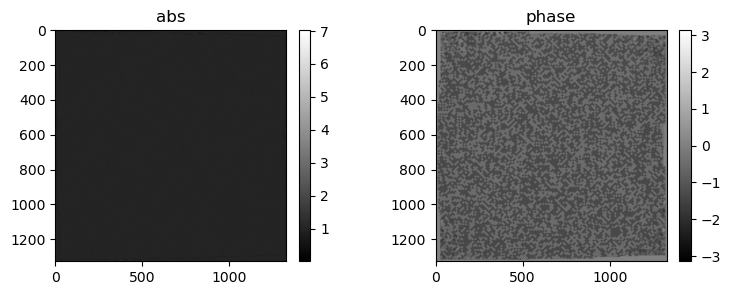

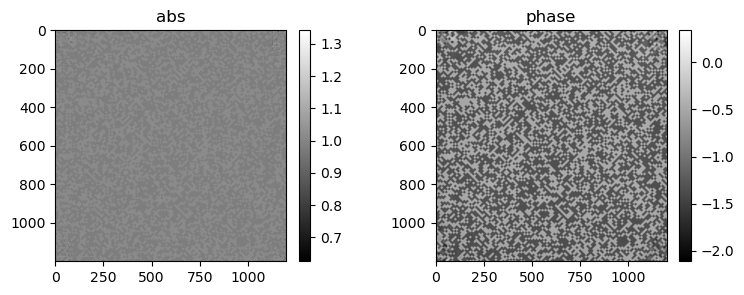

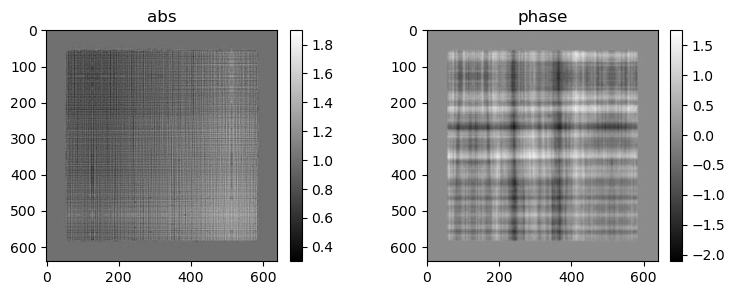

1025) gammah=0.1509733498096466, gammaprbh=0.022006938233971596, err=7.47220e+01
1026) gammah=0.24053633213043213, gammaprbh=0.03575921803712845, err=7.47214e+01
1027) gammah=0.1961890310049057, gammaprbh=0.022048911079764366, err=7.47209e+01
1028) gammah=0.2232242375612259, gammaprbh=0.017583927139639854, err=7.47206e+01
1029) gammah=0.21590939164161682, gammaprbh=0.019444169476628304, err=7.47204e+01
1030) gammah=0.10419989377260208, gammaprbh=0.03137668967247009, err=7.47201e+01
1031) gammah=0.11008232086896896, gammaprbh=0.06999371945858002, err=7.47196e+01
1032) gammah=0.19768688082695007, gammaprbh=0.03711992874741554, err=7.47191e+01
1033) gammah=0.19214464724063873, gammaprbh=0.023334193974733353, err=7.47187e+01
1034) gammah=0.22177539765834808, gammaprbh=0.01699165441095829, err=7.47183e+01
1035) gammah=0.1897478848695755, gammaprbh=0.018431374803185463, err=7.47182e+01
1036) gammah=0.16952478885650635, gammaprbh=0.024957194924354553, err=7.47181e+01
1037) gammah=0.1973080337

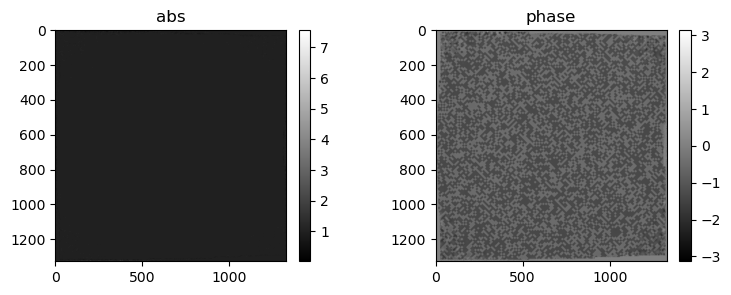

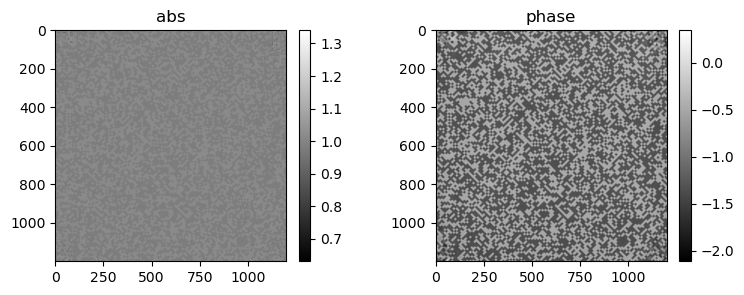

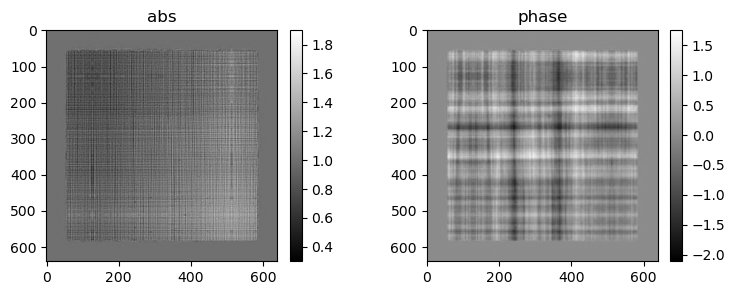

1089) gammah=0.15465082228183746, gammaprbh=0.017276860773563385, err=7.46867e+01
1090) gammah=0.14736217260360718, gammaprbh=0.013767540454864502, err=7.46839e+01
1091) gammah=0.14136822521686554, gammaprbh=0.015780068933963776, err=7.46807e+01
1092) gammah=0.14134064316749573, gammaprbh=0.01584436185657978, err=7.46777e+01
1093) gammah=0.14128023386001587, gammaprbh=0.01483169011771679, err=7.46752e+01
1094) gammah=0.13453951478004456, gammaprbh=0.016121214255690575, err=7.46730e+01
1095) gammah=0.14307191967964172, gammaprbh=0.019203506410121918, err=7.46711e+01
1096) gammah=0.15341544151306152, gammaprbh=0.018342023715376854, err=7.46694e+01
1097) gammah=0.15452703833580017, gammaprbh=0.019081387668848038, err=7.46676e+01
1098) gammah=0.1591874361038208, gammaprbh=0.02146291919052601, err=7.46659e+01
1099) gammah=0.16414517164230347, gammaprbh=0.02158966474235058, err=7.46642e+01
1100) gammah=0.16686765849590302, gammaprbh=0.023503534495830536, err=7.46626e+01
1101) gammah=0.171303

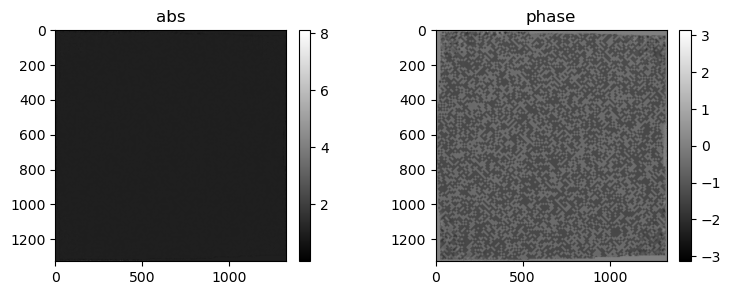

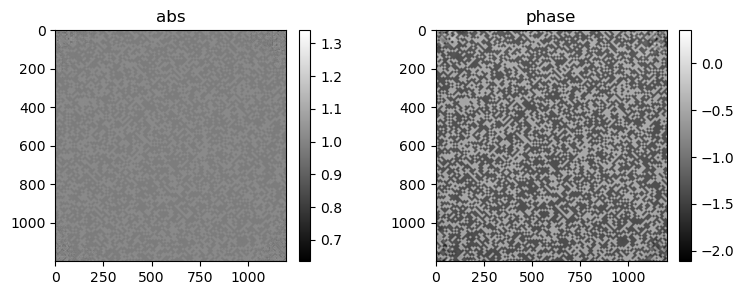

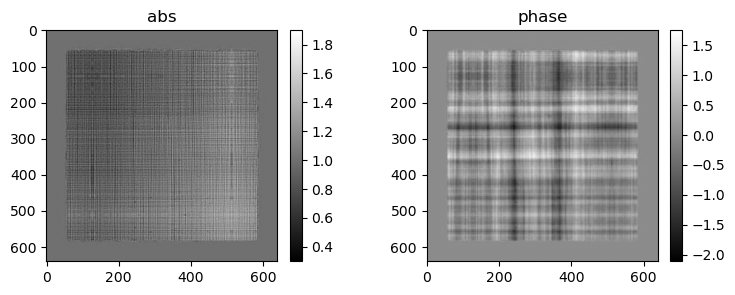

1153) gammah=0.15461456775665283, gammaprbh=0.02168801799416542, err=7.46302e+01
1154) gammah=0.17158585786819458, gammaprbh=0.022339146584272385, err=7.46300e+01
1155) gammah=0.4000094532966614, gammaprbh=0.007488012779504061, err=7.46300e+01
1156) gammah=0.16684500873088837, gammaprbh=0.013925931416451931, err=7.46297e+01
1157) gammah=0.24572564661502838, gammaprbh=0.012664020992815495, err=7.46294e+01
1158) gammah=0.1379641443490982, gammaprbh=0.023210449144244194, err=7.46291e+01
1159) gammah=0.14024919271469116, gammaprbh=0.01849418878555298, err=7.46287e+01
1160) gammah=0.12302897870540619, gammaprbh=0.08578801155090332, err=7.46285e+01
1161) gammah=0.16859650611877441, gammaprbh=0.023147229105234146, err=7.46283e+01
1162) gammah=0.20335564017295837, gammaprbh=0.023288164287805557, err=7.46283e+01
1163) gammah=0.2470971941947937, gammaprbh=0.022464554756879807, err=7.46282e+01
1164) gammah=0.24448555707931519, gammaprbh=0.018852639943361282, err=7.46281e+01
1165) gammah=0.1456538

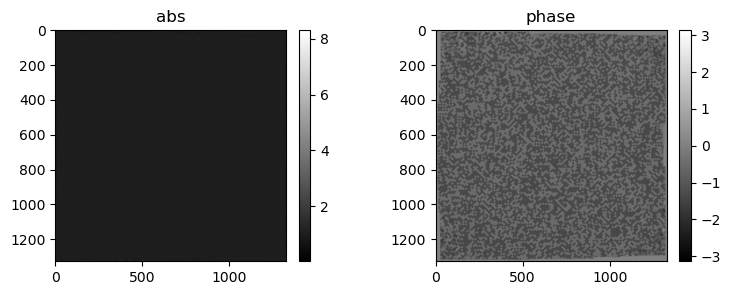

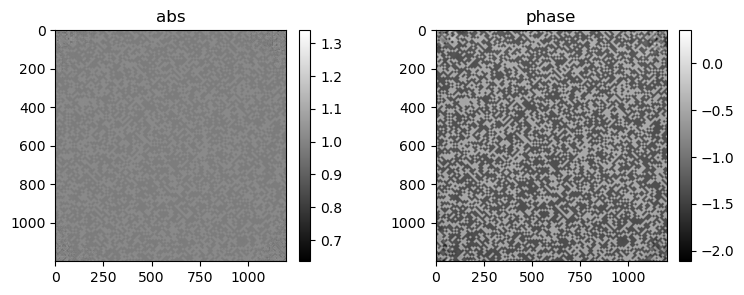

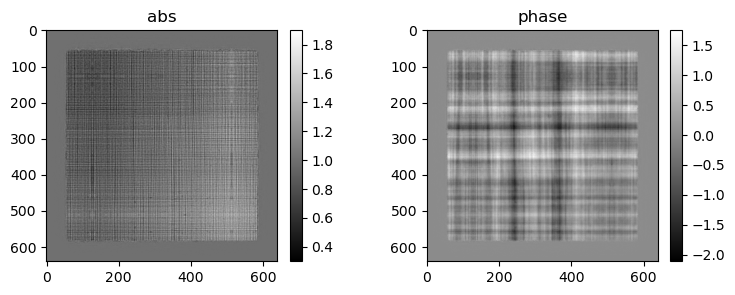

1217) gammah=0.14781463146209717, gammaprbh=0.03004307858645916, err=7.46155e+01
1218) gammah=0.146772101521492, gammaprbh=0.01672518625855446, err=7.46154e+01
1219) gammah=0.12290956825017929, gammaprbh=0.08659402281045914, err=7.46152e+01
1220) gammah=0.15203651785850525, gammaprbh=0.050128497183322906, err=7.46149e+01
1221) gammah=0.15455713868141174, gammaprbh=0.015301039442420006, err=7.46148e+01
1222) gammah=0.13662336766719818, gammaprbh=0.09042616933584213, err=7.46147e+01
1223) gammah=0.12615253031253815, gammaprbh=0.034939784556627274, err=7.46145e+01
1224) gammah=0.15680186450481415, gammaprbh=0.03576454892754555, err=7.46144e+01
1225) gammah=0.17653532326221466, gammaprbh=0.03611243516206741, err=7.46144e+01
1226) gammah=0.2520408630371094, gammaprbh=0.023529039695858955, err=7.46143e+01
1227) gammah=0.19562461972236633, gammaprbh=0.03468380868434906, err=7.46143e+01
1228) gammah=0.17440573871135712, gammaprbh=0.0313023142516613, err=7.46141e+01
1229) gammah=0.2535746097564

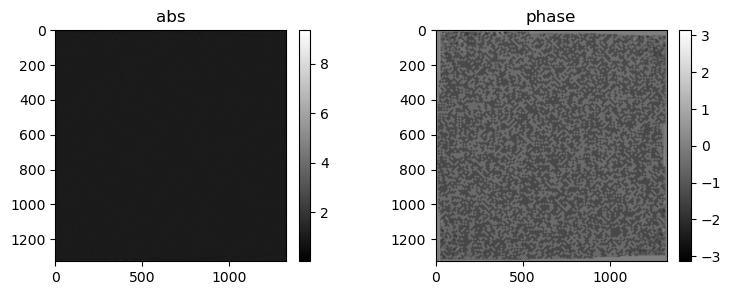

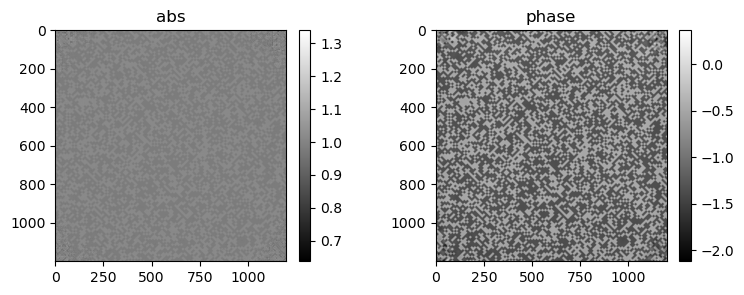

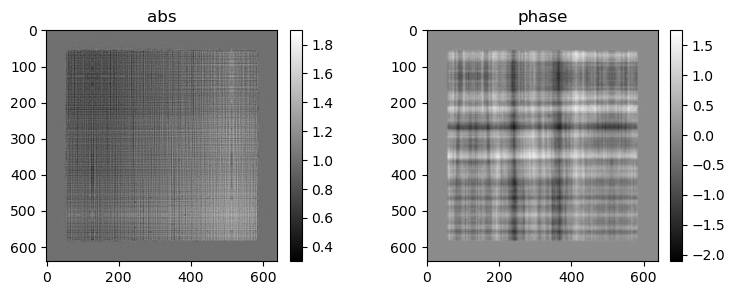

1281) gammah=0.23488077521324158, gammaprbh=0.007152295205742121, err=7.45719e+01
1282) gammah=0.22087298333644867, gammaprbh=0.028645554557442665, err=7.45718e+01
1283) gammah=0.23849940299987793, gammaprbh=0.015310816466808319, err=7.45717e+01
1284) gammah=0.16368187963962555, gammaprbh=0.023475266993045807, err=7.45715e+01
1285) gammah=0.11927426606416702, gammaprbh=0.015328798443078995, err=7.45713e+01
1286) gammah=0.24694222211837769, gammaprbh=0.0331745445728302, err=7.45711e+01
1287) gammah=0.14844684302806854, gammaprbh=0.025543510913848877, err=7.45708e+01
1288) gammah=0.14873670041561127, gammaprbh=0.014330185949802399, err=7.45705e+01
1289) gammah=0.17265285551548004, gammaprbh=0.01678660325706005, err=7.45703e+01
1290) gammah=0.14884421229362488, gammaprbh=0.0259053073823452, err=7.45701e+01
1291) gammah=0.16234460473060608, gammaprbh=0.03115849569439888, err=7.45699e+01
1292) gammah=0.12598122656345367, gammaprbh=0.03285562992095947, err=7.45697e+01
1293) gammah=0.12859526

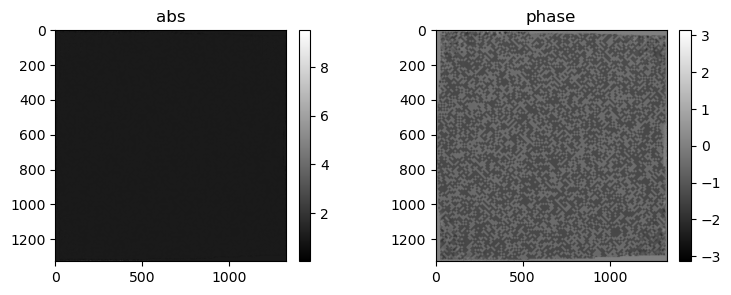

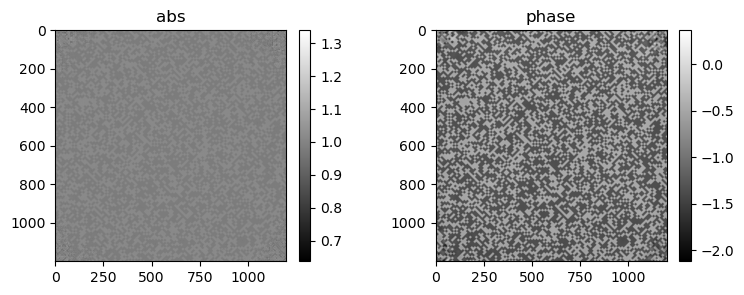

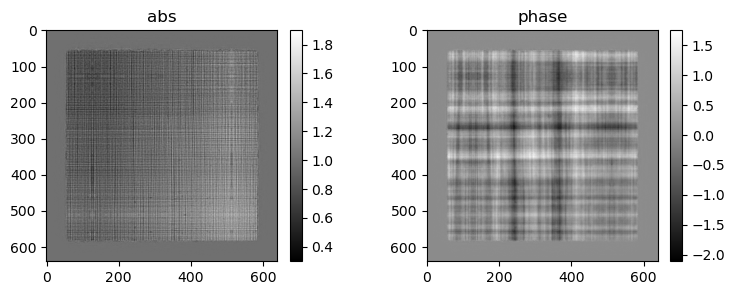

1345) gammah=0.2262539565563202, gammaprbh=0.03424743935465813, err=7.45586e+01
1346) gammah=0.12065023183822632, gammaprbh=0.10885923355817795, err=7.45584e+01
1347) gammah=0.13184373080730438, gammaprbh=0.05673184618353844, err=7.45581e+01
1348) gammah=0.10125666111707687, gammaprbh=0.05363522842526436, err=7.45579e+01
1349) gammah=0.17554856836795807, gammaprbh=0.0166460070759058, err=7.45579e+01
1350) gammah=0.06910128891468048, gammaprbh=0.11501342803239822, err=7.45578e+01
1351) gammah=0.03553479537367821, gammaprbh=0.29190871119499207, err=7.45562e+01
1352) gammah=0.06325020641088486, gammaprbh=0.09554201364517212, err=7.45530e+01
1353) gammah=0.1080913320183754, gammaprbh=0.07725951820611954, err=7.45505e+01
1354) gammah=0.1346597969532013, gammaprbh=0.06292673200368881, err=7.45480e+01
1355) gammah=0.08764638006687164, gammaprbh=0.06579863280057907, err=7.45461e+01
1356) gammah=0.06825821101665497, gammaprbh=0.048879463225603104, err=7.45448e+01
1357) gammah=0.1231148466467857

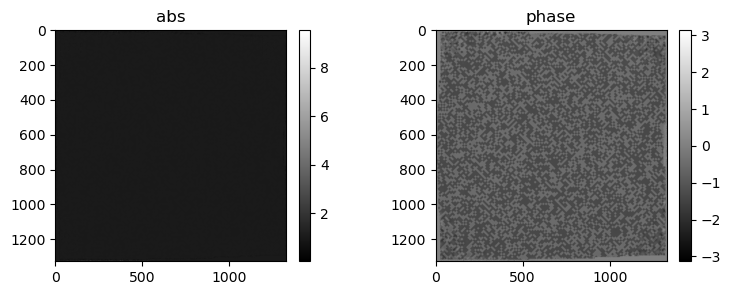

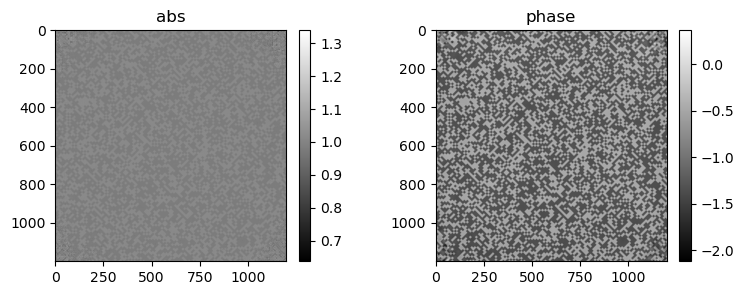

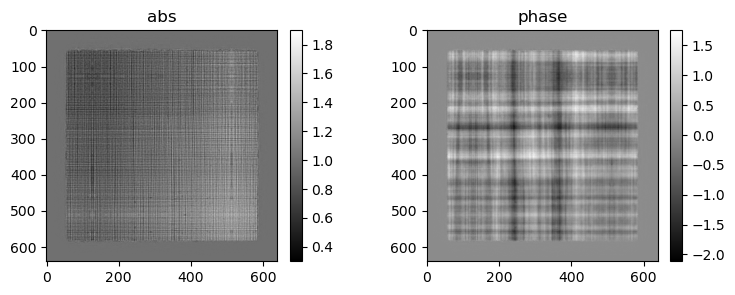

1409) gammah=0.23232132196426392, gammaprbh=0.022485174238681793, err=7.45016e+01
1410) gammah=0.10793960839509964, gammaprbh=0.02294755168259144, err=7.45015e+01
1411) gammah=0.18827442824840546, gammaprbh=0.02142815664410591, err=7.45014e+01
1412) gammah=0.17580252885818481, gammaprbh=0.023947952315211296, err=7.45014e+01
1413) gammah=0.14736957848072052, gammaprbh=0.06905840337276459, err=7.45012e+01
1414) gammah=0.1341426968574524, gammaprbh=0.04321752488613129, err=7.45010e+01
1415) gammah=0.1777004450559616, gammaprbh=0.013826931826770306, err=7.45009e+01
1416) gammah=0.14627954363822937, gammaprbh=0.036437973380088806, err=7.45008e+01
1417) gammah=0.12890730798244476, gammaprbh=0.04754076153039932, err=7.45007e+01
1418) gammah=0.11054518073797226, gammaprbh=0.08854880183935165, err=7.45005e+01
1419) gammah=0.10872293263673782, gammaprbh=0.13686834275722504, err=7.44999e+01
1420) gammah=0.09684653580188751, gammaprbh=0.059454627335071564, err=7.44995e+01
1421) gammah=0.1430970281

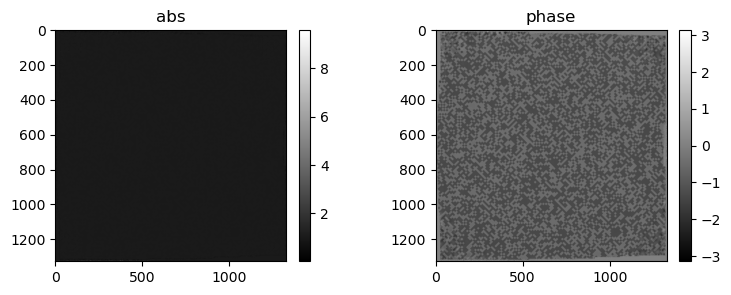

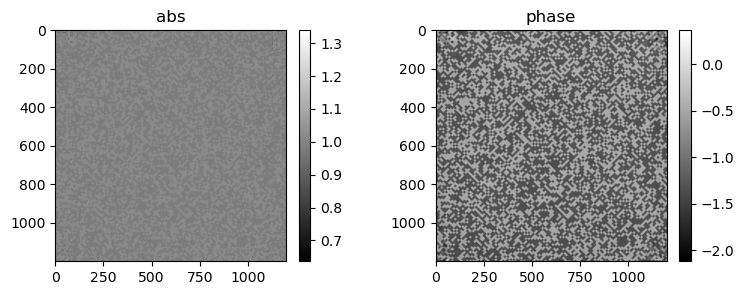

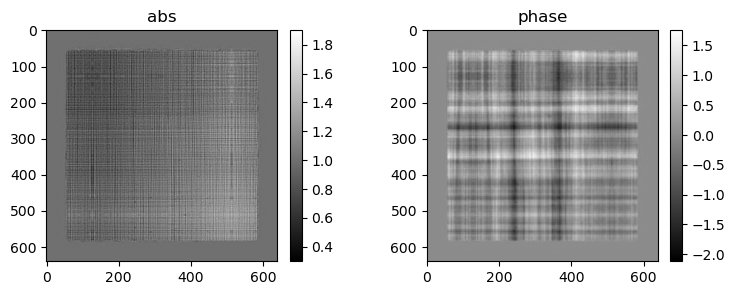

1473) gammah=0.2145356684923172, gammaprbh=0.04717486724257469, err=7.44061e+01
1474) gammah=0.2424982786178589, gammaprbh=0.03295331448316574, err=7.44059e+01
1475) gammah=0.10217093676328659, gammaprbh=0.030626043677330017, err=7.44056e+01
1476) gammah=0.08283331245183945, gammaprbh=0.029001757502555847, err=7.44054e+01
1477) gammah=0.23382291197776794, gammaprbh=0.02685701660811901, err=7.44052e+01
1478) gammah=0.18731310963630676, gammaprbh=0.023897109553217888, err=7.44051e+01
1479) gammah=0.08832842856645584, gammaprbh=0.17998792231082916, err=7.44048e+01
1480) gammah=0.08727148920297623, gammaprbh=0.0626794695854187, err=7.44045e+01
1481) gammah=0.1912597119808197, gammaprbh=0.031181827187538147, err=7.44044e+01
1482) gammah=0.14650139212608337, gammaprbh=0.01955091394484043, err=7.44043e+01
1483) gammah=0.23448577523231506, gammaprbh=0.02503240294754505, err=7.44043e+01
1484) gammah=0.1270393282175064, gammaprbh=0.03175214305520058, err=7.44042e+01
1485) gammah=0.18290835618972

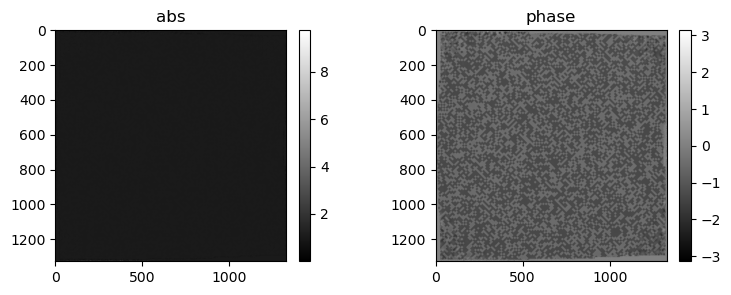

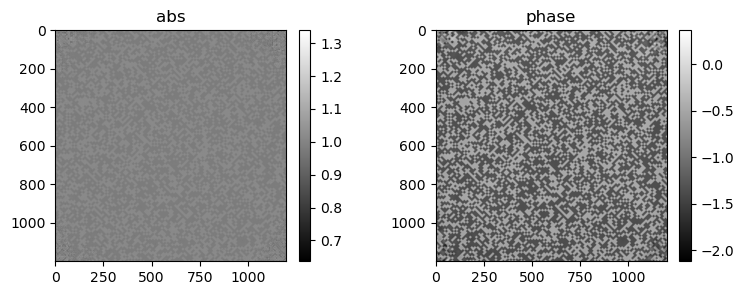

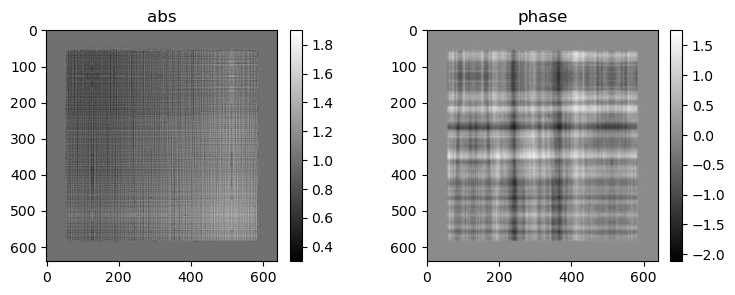

1537) gammah=0.1479630321264267, gammaprbh=0.03095855936408043, err=7.43952e+01
1538) gammah=0.1738034039735794, gammaprbh=0.033408984541893005, err=7.43951e+01
1539) gammah=0.15116392076015472, gammaprbh=0.04790567606687546, err=7.43950e+01
1540) gammah=0.16525286436080933, gammaprbh=0.021227022632956505, err=7.43950e+01
1541) gammah=0.15190255641937256, gammaprbh=0.07834240794181824, err=7.43949e+01
1542) gammah=0.19428515434265137, gammaprbh=0.012397310696542263, err=7.43949e+01
1543) gammah=0.18153347074985504, gammaprbh=0.0568779855966568, err=7.43948e+01
1544) gammah=0.13790148496627808, gammaprbh=0.025211593136191368, err=7.43947e+01
1545) gammah=0.19588443636894226, gammaprbh=0.02921195887029171, err=7.43946e+01
1546) gammah=0.14857101440429688, gammaprbh=0.021583206951618195, err=7.43946e+01
1547) gammah=0.1342347413301468, gammaprbh=0.07875090837478638, err=7.43945e+01
1548) gammah=0.20032483339309692, gammaprbh=0.021091831848025322, err=7.43944e+01
1549) gammah=0.16490747034

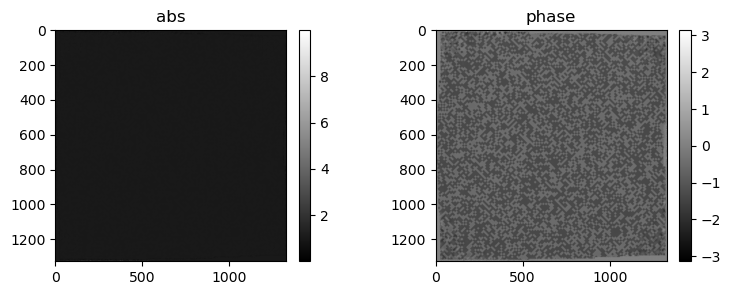

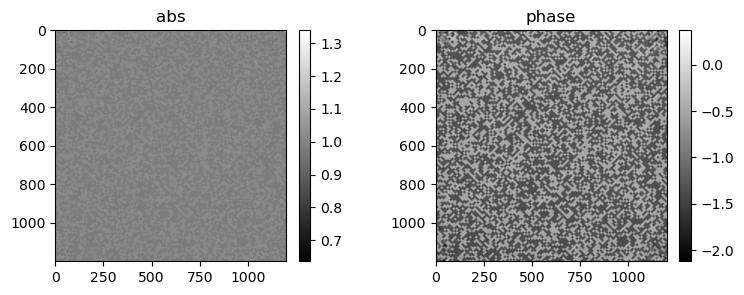

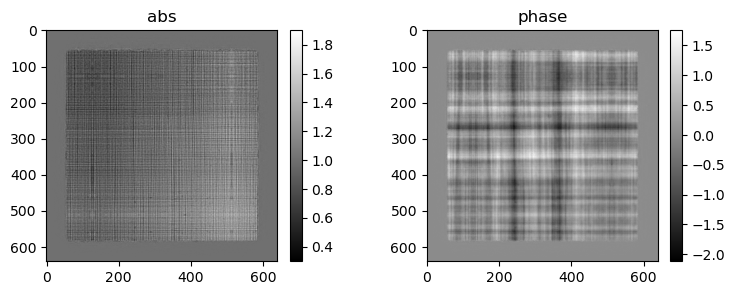

1601) gammah=0.13596102595329285, gammaprbh=0.03207716345787048, err=7.43861e+01
1602) gammah=0.1320818066596985, gammaprbh=0.014509187079966068, err=7.43861e+01
1603) gammah=0.1484128087759018, gammaprbh=0.05258907005190849, err=7.43860e+01
1604) gammah=0.1600901335477829, gammaprbh=0.03953377902507782, err=7.43860e+01
1605) gammah=0.1370885819196701, gammaprbh=0.08991900086402893, err=7.43858e+01
1606) gammah=0.08425597846508026, gammaprbh=0.08859309554100037, err=7.43856e+01
1607) gammah=0.08972396701574326, gammaprbh=0.10817902535200119, err=7.43852e+01
1608) gammah=0.1079183965921402, gammaprbh=0.06618914753198624, err=7.43848e+01
1609) gammah=0.1315477192401886, gammaprbh=0.029645131900906563, err=7.43846e+01
1610) gammah=0.1439565122127533, gammaprbh=0.01574401557445526, err=7.43846e+01
1611) gammah=0.16400359570980072, gammaprbh=0.06379799544811249, err=7.43845e+01
1612) gammah=0.14322781562805176, gammaprbh=0.04245487228035927, err=7.43845e+01
1613) gammah=0.10632003098726273,

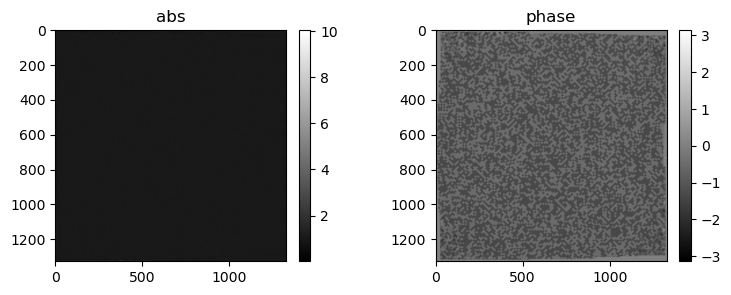

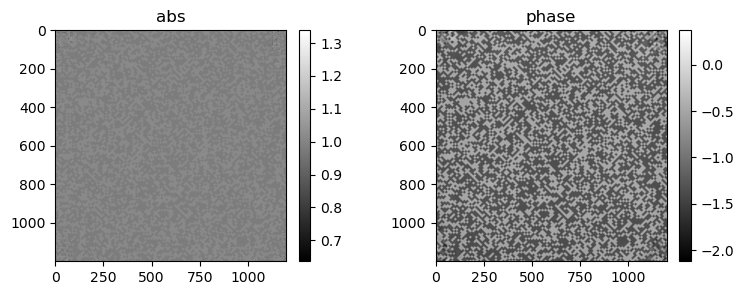

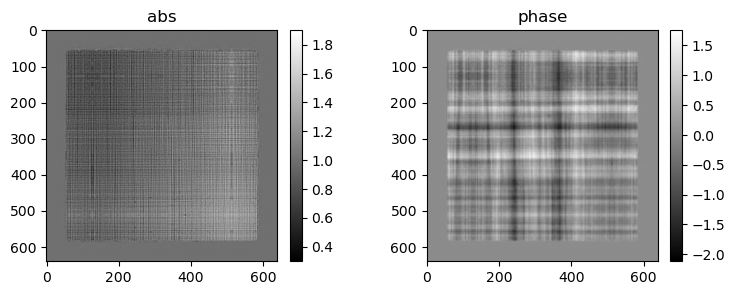

1665) gammah=0.14963898062705994, gammaprbh=0.06710080057382584, err=7.43738e+01
1666) gammah=0.1542719006538391, gammaprbh=0.018750790506601334, err=7.43738e+01
1667) gammah=0.1297929286956787, gammaprbh=0.07047933340072632, err=7.43737e+01
1668) gammah=0.11965496838092804, gammaprbh=0.04522209241986275, err=7.43737e+01
1669) gammah=0.13441690802574158, gammaprbh=0.08992543816566467, err=7.43736e+01
1670) gammah=0.1291559487581253, gammaprbh=0.08038588613271713, err=7.43734e+01
1671) gammah=0.14291176199913025, gammaprbh=0.0421660840511322, err=7.43733e+01
1672) gammah=0.1353517323732376, gammaprbh=0.04841002821922302, err=7.43732e+01
1673) gammah=0.21575425565242767, gammaprbh=0.014983872883021832, err=7.43732e+01
1674) gammah=0.09793095290660858, gammaprbh=0.11829043924808502, err=7.43731e+01
1675) gammah=0.16655848920345306, gammaprbh=0.051280613988637924, err=7.43730e+01
1676) gammah=0.20056751370429993, gammaprbh=0.0043452042154967785, err=7.43730e+01
1677) gammah=0.1511018276214

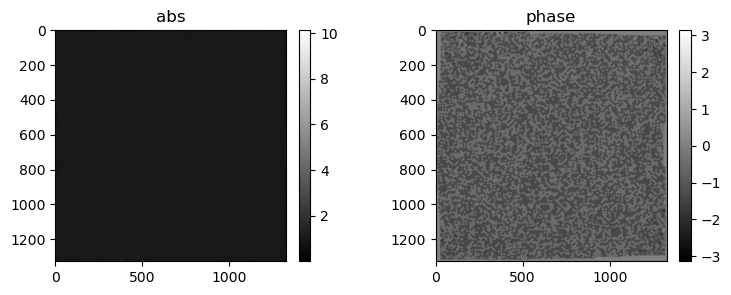

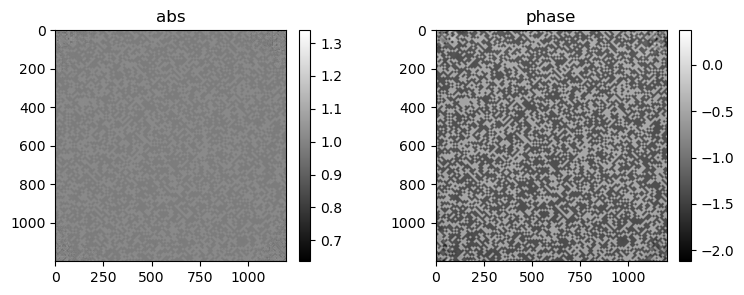

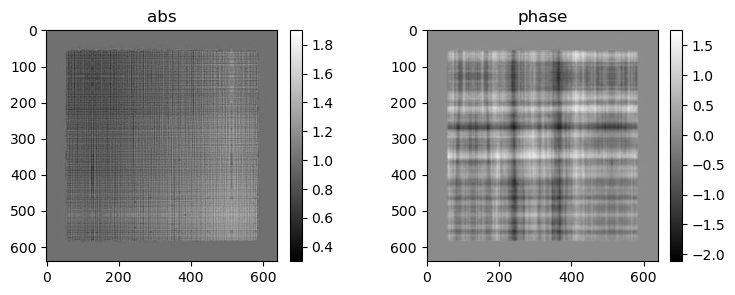

1729) gammah=0.1553947627544403, gammaprbh=0.021424291655421257, err=7.43646e+01
1730) gammah=0.15779231488704681, gammaprbh=0.02065528742969036, err=7.43644e+01
1731) gammah=0.18769577145576477, gammaprbh=0.010785126127302647, err=7.43643e+01
1732) gammah=0.13194046914577484, gammaprbh=0.028983257710933685, err=7.43642e+01
1733) gammah=0.13424886763095856, gammaprbh=0.03195492550730705, err=7.43640e+01
1734) gammah=0.15710119903087616, gammaprbh=0.02618415467441082, err=7.43639e+01
1735) gammah=0.12545011937618256, gammaprbh=0.06791657209396362, err=7.43638e+01
1736) gammah=0.1494268923997879, gammaprbh=0.037215474992990494, err=7.43637e+01
1737) gammah=0.1280941516160965, gammaprbh=0.0353144146502018, err=7.43636e+01
1738) gammah=0.22860188782215118, gammaprbh=0.022222133353352547, err=7.43636e+01
1739) gammah=0.2023102343082428, gammaprbh=0.040927622467279434, err=7.43636e+01
1740) gammah=0.19521141052246094, gammaprbh=0.04553164541721344, err=7.43635e+01
1741) gammah=0.149795576930

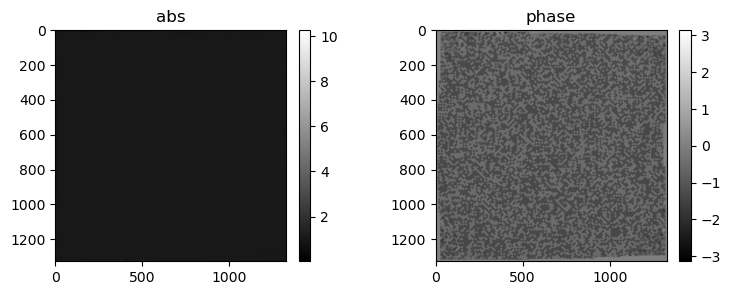

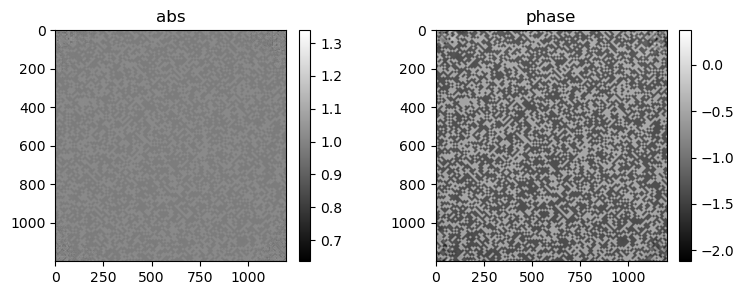

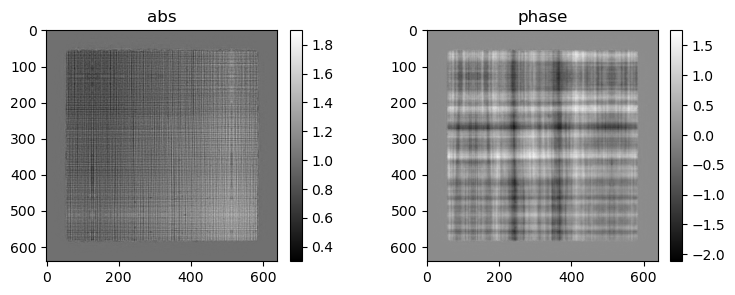

1793) gammah=0.1596539467573166, gammaprbh=0.01335993129760027, err=7.43573e+01
1794) gammah=0.15528461337089539, gammaprbh=0.04779523238539696, err=7.43572e+01
1795) gammah=0.12052422761917114, gammaprbh=0.032195430248975754, err=7.43572e+01
1796) gammah=0.13165810704231262, gammaprbh=0.10710355639457703, err=7.43571e+01
1797) gammah=0.1807916909456253, gammaprbh=0.04309726879000664, err=7.43570e+01
1798) gammah=0.13750900328159332, gammaprbh=0.04648701474070549, err=7.43570e+01
1799) gammah=0.18265007436275482, gammaprbh=0.06723999232053757, err=7.43569e+01
1800) gammah=0.26552385091781616, gammaprbh=0.03185500204563141, err=7.43568e+01
1801) gammah=0.21808704733848572, gammaprbh=0.0040459828451275826, err=7.43568e+01
1802) gammah=0.17611834406852722, gammaprbh=0.047785189002752304, err=7.43567e+01
1803) gammah=0.14364564418792725, gammaprbh=0.028430268168449402, err=7.43566e+01
1804) gammah=0.1864573210477829, gammaprbh=0.005269935820251703, err=7.43566e+01
1805) gammah=0.1668097078

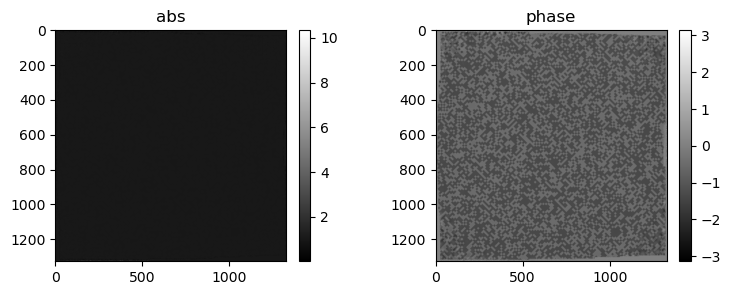

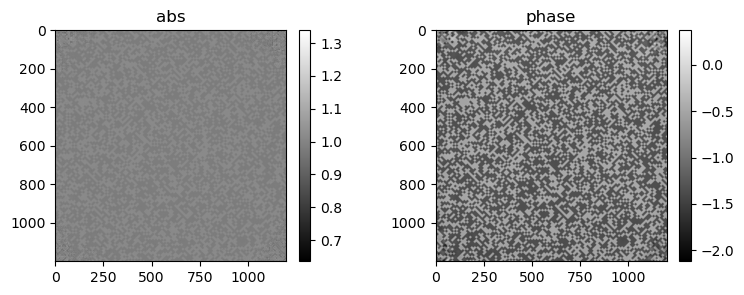

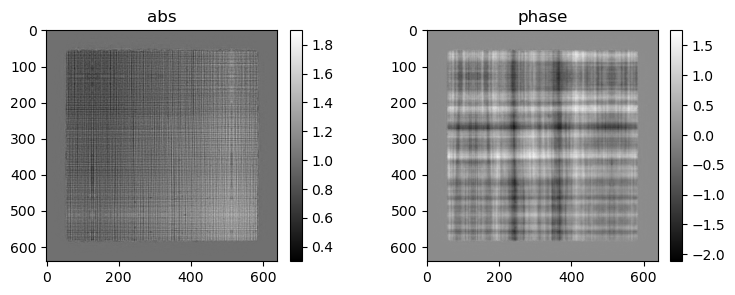

1857) gammah=0.20963068306446075, gammaprbh=0.03405718877911568, err=7.43510e+01
1858) gammah=0.21539869904518127, gammaprbh=0, err=7.43509e+01
1859) gammah=0.2560504674911499, gammaprbh=0.03177514672279358, err=7.43506e+01
1860) gammah=0.21220439672470093, gammaprbh=0.007738613523542881, err=7.43504e+01
1861) gammah=0.10763885080814362, gammaprbh=0.04369121044874191, err=7.43499e+01
1862) gammah=0.08514181524515152, gammaprbh=0.019413311034440994, err=7.43495e+01
1863) gammah=0.22428320348262787, gammaprbh=0.012538312003016472, err=7.43493e+01
1864) gammah=0.21196359395980835, gammaprbh=0.014355853199958801, err=7.43492e+01
1865) gammah=0.12051726877689362, gammaprbh=0.014501837082207203, err=7.43491e+01
1866) gammah=0.17508722841739655, gammaprbh=0.015613898634910583, err=7.43490e+01
1867) gammah=0.206093430519104, gammaprbh=0.0220214631408453, err=7.43490e+01
1868) gammah=0.13972581923007965, gammaprbh=0.042863257229328156, err=7.43489e+01
1869) gammah=0.13591279089450836, gammaprbh

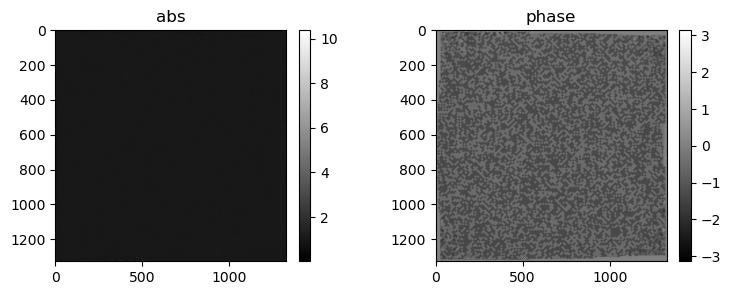

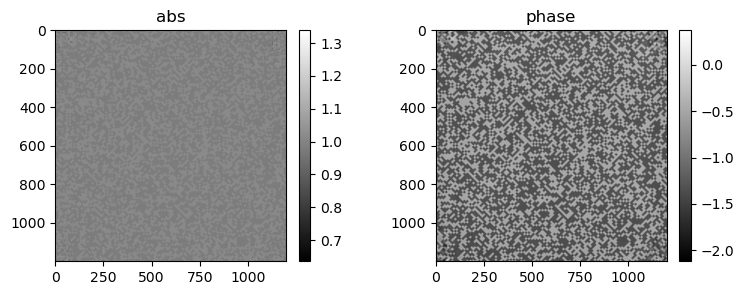

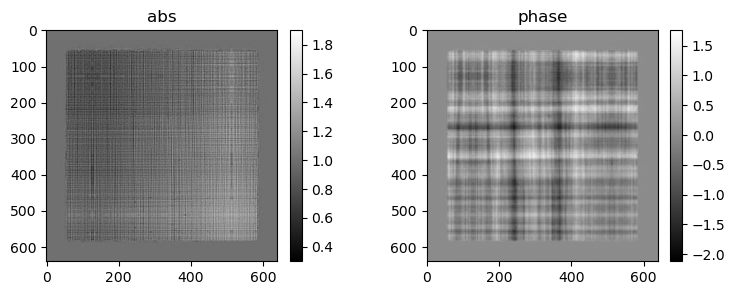

1921) gammah=0.2206198126077652, gammaprbh=0.02010629139840603, err=7.43419e+01
1922) gammah=0.1269625872373581, gammaprbh=0.03839697688817978, err=7.43419e+01
1923) gammah=0.14688833057880402, gammaprbh=0.042006716132164, err=7.43418e+01
1924) gammah=0.15350203216075897, gammaprbh=0.04516715183854103, err=7.43417e+01
1925) gammah=0.22315867245197296, gammaprbh=0.07116509228944778, err=7.43416e+01
1926) gammah=0.21704357862472534, gammaprbh=0.019740799441933632, err=7.43415e+01
1927) gammah=0.18447360396385193, gammaprbh=0.0063155400566756725, err=7.43414e+01
1928) gammah=0.21155010163784027, gammaprbh=0.01807551085948944, err=7.43413e+01
1929) gammah=0.18478336930274963, gammaprbh=0.011467528529465199, err=7.43412e+01
1930) gammah=0.2273680567741394, gammaprbh=0.01857040449976921, err=7.43410e+01
1931) gammah=0.21282047033309937, gammaprbh=0.012163090519607067, err=7.43409e+01
1932) gammah=0.21313191950321198, gammaprbh=0.01622258871793747, err=7.43406e+01
1933) gammah=0.2063797712326

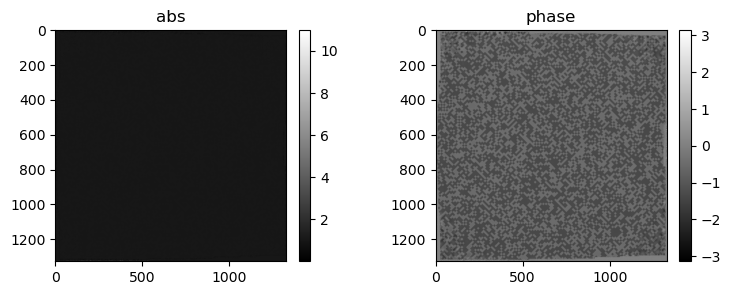

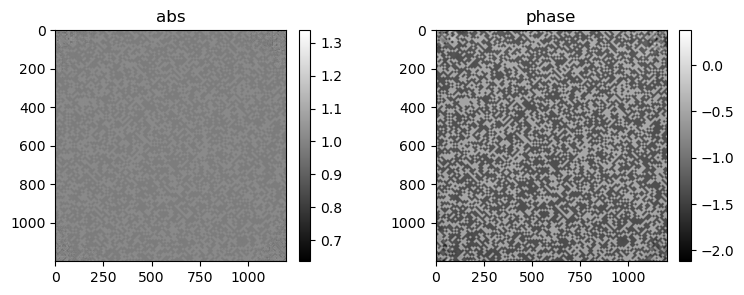

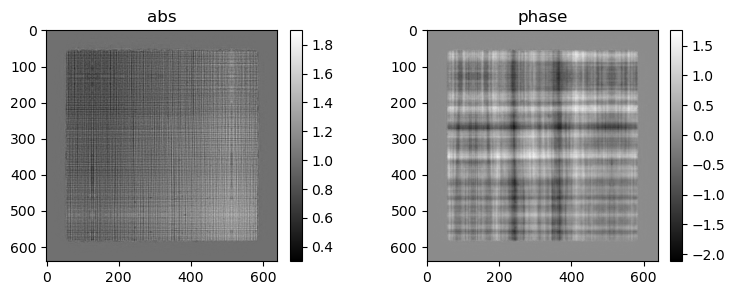

1985) gammah=0.21523237228393555, gammaprbh=0.010790525935590267, err=7.43238e+01
1986) gammah=0.18338565528392792, gammaprbh=0.024253154173493385, err=7.43237e+01
1987) gammah=0.10133130103349686, gammaprbh=0.03306959569454193, err=7.43235e+01
1988) gammah=0.12275850772857666, gammaprbh=0.04553705081343651, err=7.43234e+01
1989) gammah=0.20029276609420776, gammaprbh=0.014650754630565643, err=7.43234e+01
1990) gammah=0.20753364264965057, gammaprbh=0.02857169695198536, err=7.43234e+01
1991) gammah=0.19159361720085144, gammaprbh=0.020117999985814095, err=7.43233e+01
1992) gammah=0.17024104297161102, gammaprbh=0.03840222582221031, err=7.43233e+01
1993) gammah=0.10810068994760513, gammaprbh=0.050133321434259415, err=7.43232e+01
1994) gammah=0.1844913512468338, gammaprbh=0.02681996114552021, err=7.43231e+01
1995) gammah=0.18633721768856049, gammaprbh=0.024574948474764824, err=7.43231e+01
1996) gammah=0.14808295667171478, gammaprbh=0.04113994166254997, err=7.43230e+01
1997) gammah=0.19121325

In [111]:
import time
def line_search(minf, gamma, fu, fd):
    """ Line search for the step sizes gamma"""
    while (minf(fu)-minf(fu+gamma*fd) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if (gamma <= 1e-12):  # direction not found
        # print('no direction')
        gamma = 0
    return gamma

def hessian2(Lpsi,Lksi,Leta,data):
    # Lksi0 = fwd_holo(ksi,prb)
    # Leta0 = fwd_holo(eta,prb)
    # Lpsi0 = fwd_holo(psi,prb)        
    # print(cp.linalg.norm(Lksi0-Lksi))
    # print(cp.linalg.norm(Leta0-Leta))
    # print(cp.linalg.norm(Lpsi0-Lpsi))

    v1 = cp.abs(Lpsi)-data
    v2 = cp.real(cp.conj(Lksi)*Leta)/cp.abs(Lpsi)            
    v3 = cp.real(cp.conj(Lpsi)*Lksi) * cp.real(cp.conj(Lpsi)*Leta) / cp.abs(Lpsi)**3    
    v4 = cp.real(cp.conj(Lpsi)*Lksi)/cp.abs(Lpsi)
    v5 = cp.real(cp.conj(Lpsi)*Leta)/cp.abs(Lpsi)
    return 2*(cp.sum(v1 * cp.conj(v2-v3)) + cp.sum(v4*cp.conj(v5)))

    
def hessianprb2(Lpsi,Lksi,Leta,data):
    # Lksi0 = fwd_holo(psi,ksi)
    # Leta0 = fwd_holo(psi,eta)
    # Lpsi0 = fwd_holo(psi,prb)        
    # print(cp.linalg.norm(Lksi0-Lksi))
    # print(cp.linalg.norm(Leta0-Leta))
    # print(cp.linalg.norm(Lpsi0-Lpsi))

    v1 = cp.abs(Lpsi)-data
    v2 = cp.real(cp.conj(Lksi)*Leta)/cp.abs(Lpsi)            
    v3 = cp.real(cp.conj(Lpsi)*Lksi) * cp.real(cp.conj(Lpsi)*Leta) / cp.abs(Lpsi)**3    
    v4 = cp.real(cp.conj(Lpsi)*Lksi)/cp.abs(Lpsi)
    v5 = cp.real(cp.conj(Lpsi)*Leta)/cp.abs(Lpsi)
    return 2*(cp.sum(v1 * cp.conj(v2-v3)) + cp.sum(v4*cp.conj(v5)))

def cg_holo(data,ref, init_psi,init_prb,  pars):
    """Conjugate gradients method for holography"""
    # minimization functional
    def minf(fpsi):
        f = np.linalg.norm(np.abs(fpsi)-data)**2
        return f

    data = np.sqrt(data)
    ref = np.sqrt(ref)
    psi = init_psi.copy()
    prb = init_prb.copy()

    conv = np.zeros(pars['niter'])
    tt = np.zeros(5)
    gammah=0
    gammaprbh=0

    fpsi = fwd_holo(psi,prb)
        
    for i in range(pars['niter']):
        
        grad = adj_holo(fpsi-data*np.exp(1j*np.angle(fpsi)),prb)        
        fgrad = fwd_holo(grad,prb)
        
        if i == 0:
            eta = -grad            
            feta = -fgrad
        else:            
            feta = feta+gammaprbh*fetaprb
            # feta = fwd_holo(eta,prb)                                    
            # print('!!!',cp.linalg.norm(feta0-feta)/cp.linalg.norm(feta))
        
            beta = hessian2(fpsi,fgrad,feta,data)/hessian2(fpsi,feta,feta,data) 
            eta = -grad + beta*eta
            feta = -fgrad + beta*feta  
        
        gammah = float(-cp.sum(cp.real(grad*cp.conj(eta)))/hessian2(fpsi,feta,feta,data))
        gammah = line_search(minf, gammah, fpsi, feta)        
        psi += gammah*eta
        fpsi += gammah*feta
        
        if pars['update_probe']:
            
            gradprb = adj_holo_prb(fpsi-data*np.exp(1j*np.angle(fpsi)),psi)
            fgradprb = fwd_holo(psi,gradprb)
            if i == 0:
                etaprb = -gradprb            
                fetaprb = -fgradprb
            else:
                fetaprb = fetaprb+gammah*feta
                # fetaprb = fwd_holo(psi,etaprb)
                # print('!!!',cp.linalg.norm(fetaprb-fetaprb0)/cp.linalg.norm(fetaprb))
                
                beta = hessianprb2(fpsi,fgradprb,fetaprb,data)/hessianprb2(fpsi,fetaprb,fetaprb,data) 
                etaprb = -gradprb + beta*etaprb
                fetaprb = -fgradprb+beta*fetaprb

            gammaprbh = float(-cp.sum(cp.real(gradprb*cp.conj(etaprb)))/hessianprb2(fpsi,fetaprb,fetaprb,data))            
            gammaprbh = line_search(minf, gammaprbh, fpsi, fetaprb)
            prb += gammaprbh*etaprb
            fpsi += gammaprbh*fetaprb       

        if i % pars['err_step'] == 0:
            err = minf(fpsi)
            conv[i] = err
            print(f'{i}) {gammah=}, {gammaprbh=}, {err=:1.5e}')

        if i % pars['vis_step'] == 0:
            mshow_polar(psi[0],show)
            mshow_polar(psi[0,pad:-pad,pad:-pad],show)
            mshow_polar(prb[0],show)

    return psi,prb,conv

# fully on gpu
rec_psi = recMultiPaganin.copy()
data = cp.array(data00.copy())
ref = cp.array(ref0.copy())

rec_prb = cp.array(rec_prb0.copy())#cp.abs(rec_prb0).astype('complex64')#*cp.exp().copy()
# rec_psi = cp.array(np.load(f'{path}/data/code_{flg}.npy'))
# nee = rec_psi.shape[1]
# rec_psi = cp.array(rec_psi[:,nee//2-ne//2:nee//2+ne//2,nee//2-ne//2:nee//2+ne//2])
# rec_prb = cp.array(np.load(f'{path}/data/prb_{flg}.npy'))
pars = {'niter': 2000, 'err_step': 1, 'vis_step': 64, 'update_probe':True}
rec_psi,rec_prb,conv = cg_holo(data,ref,rec_psi,rec_prb, pars)

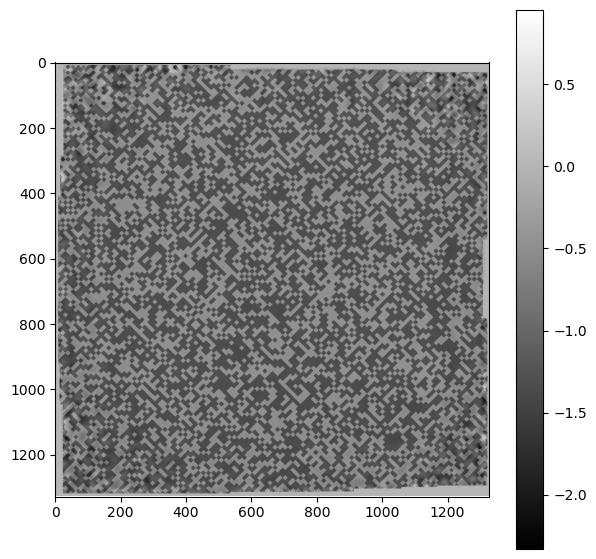

In [102]:
plt.figure(figsize=(7,7))
plt.imshow(cp.angle(rec_psi[0]).get(),cmap='gray')
plt.colorbar()

In [103]:
r = cp.array(np.load(f'{path}/data/code_{flg}.npy'))
nee = r.shape[1]
r = cp.array(r[:,nee//2-ne//2:nee//2+ne//2,nee//2-ne//2:nee//2+ne//2])

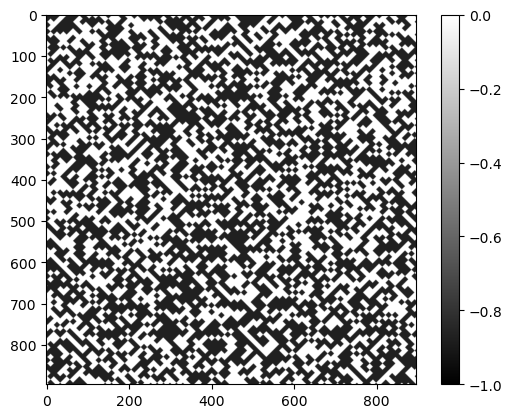

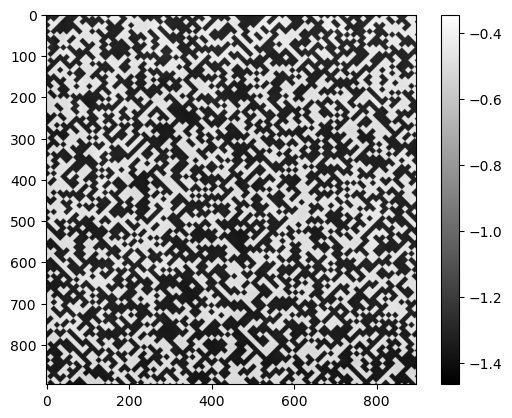

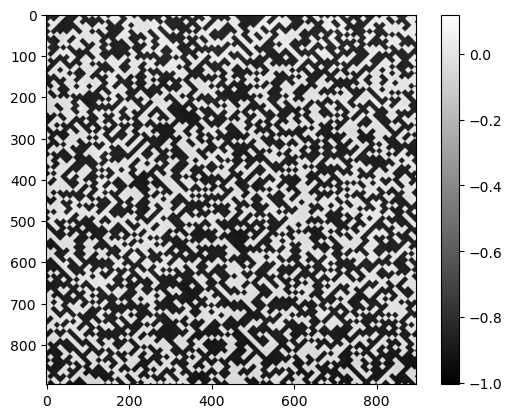

-0.46174315


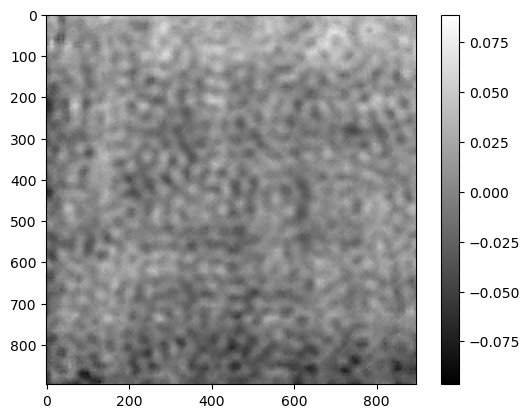

In [131]:
crop = (rec_psi.shape[-1]-(3*n//2+2*pad))//2
plt.imshow(cp.angle(r[0,crop:-crop,crop:-crop]).get(),cmap='gray',vmax=0,vmin=-1)
plt.colorbar()
plt.show()
plt.imshow(cp.angle(rec_psi[0,crop:-crop,crop:-crop]).get(),cmap='gray')#,vmax=0,vmin=-1)
plt.colorbar()
plt.show()

a = np.median(cp.angle(rec_psi[0,crop:-crop,crop:-crop]).get()-cp.angle(r[0,crop:-crop,crop:-crop]).get())
plt.imshow(cp.angle(rec_psi[0,crop:-crop,crop:-crop]).get()-a,cmap='gray')#,vmax=0,vmin=-1)
plt.colorbar()
plt.show()
print(a)
plt.imshow(cp.angle(rec_psi[0,crop:-crop,crop:-crop]).get()-cp.angle(r[0,crop:-crop,crop:-crop]).get()-a,cmap='gray')#,vmax=-0.1,vmin=0.1)
plt.colorbar()
plt.show()

# np.save('data/rec_code',rec_psi.get())


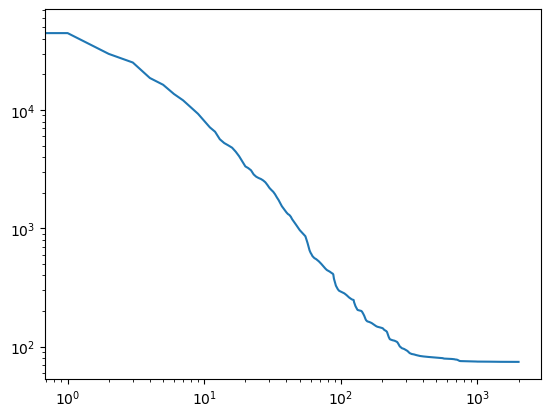

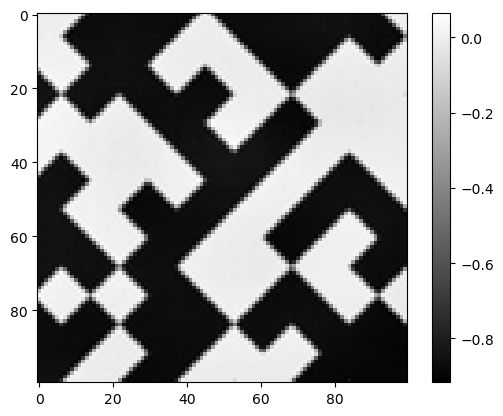

In [134]:
plt.loglog(conv)
plt.yscale('log')
plt.show()

rec_psis =rec_psi*cp.exp(-1j*a)
plt.imshow(np.angle(rec_psis[0,400:500,400:500]).get(),cmap='gray')
plt.colorbar()
np.save(f'/data2/vnikitin/coded_apertures_new3/data/code_rec_{flg}',rec_psis)

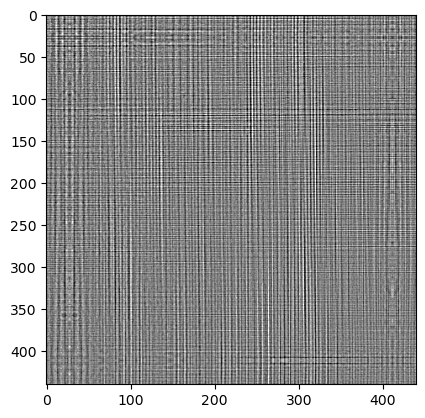

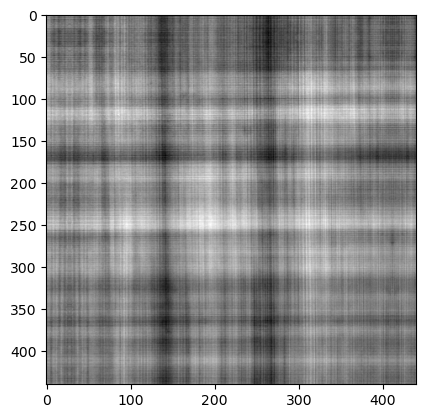

In [112]:
rr = cp.array(np.load(f'{path}/data/prb_{flg}.npy'))

#mshow_polar(rec_prb[0],show)
plt.imshow(cp.angle(rec_prb[0,100:-100,100:-100]).get(),vmin=-0.3,vmax=0.3,cmap='gray')
plt.show()
plt.imshow(cp.angle(rr[0,100:-100,100:-100]).get(),cmap='gray')
plt.show()

#mshow_polar(rr[0],show)